<a href="https://colab.research.google.com/github/agogodavid/fien/blob/main/FIEN_A_Game_Theoretic_Agent_Base_Simulation_of_Privacy_Policies_Under_Social_Pressure.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Initial Logic on why a Random Discrete Event Model works as a baseline

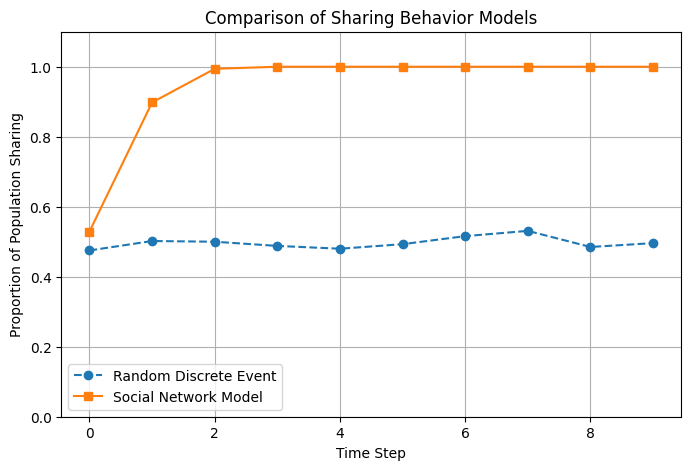

In [ ]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

# Parameters
N = 1000  # Population size
p = 0.5  # Probability of sharing in the random model
timesteps = 10  # Number of iterations

# Random Discrete Event Model
random_shares = np.zeros(timesteps)
for t in range(timesteps):
    random_shares[t] = np.sum(np.random.rand(N) < p) / N

# Social Network Model (Small-World Network)
G = nx.watts_strogatz_graph(N, k=4, p=0.1)  # Small-world network
p0 = 0.50  # Base probability of sharing
alpha = 0.5  # Influence factor

# Initial sharing state (randomly selected)
shared = np.random.rand(N) < p0
network_shares = [np.mean(shared)]

# Influence-based sharing over time
for t in range(1, timesteps):
    new_shared = shared.copy()
    for node in G.nodes():
        neighbor_shares = np.mean([shared[neighbor] for neighbor in G.neighbors(node)])
        prob_share = p0 + alpha * neighbor_shares
        if not shared[node] and np.random.rand() < prob_share:
            new_shared[node] = True
    shared = new_shared
    network_shares.append(np.mean(shared))

# Plot results
plt.figure(figsize=(8, 5))
plt.plot(range(timesteps), random_shares, label="Random Discrete Event", marker='o', linestyle='--')
plt.plot(range(timesteps), network_shares, label="Social Network Model", marker='s', linestyle='-')
plt.xlabel("Time Step")
plt.ylabel("Proportion of Population Sharing")
plt.title("Comparison of Sharing Behavior Models")
plt.legend()
plt.ylim(0, 1.1)
plt.grid(True)
plt.show()


## Claude Result


## Simulation under random decision making about sharing

## function privacy simulation 1

In [ ]:
import numpy as np
import random
from typing import List, Dict


In [ ]:

class PrivacySimulation:
    def __init__(self,
                 num_individuals: int = 100,
                 initial_corporate_aggression: float = 0.5,
                 corporate_step_boldness: float = 0.01):
        """
        Initialize the privacy exploitation simulation

        Args:
            num_individuals (int): Number of individual agents
            initial_corporate_aggression (float): Initial probability of corporate aggressive strategy
        """
        # Simulation parameters
        self.num_individuals = num_individuals
        self.corporate_aggression_prob = initial_corporate_aggression
        self.corporate_step_boldness = corporate_step_boldness

        # Track simulation state
        self.current_iteration = 0
        self.individual_sharing_history = []
        self.corporate_strategy_history = []
        self.corporate_decision_history = []
        self.corporate_decision = None
        # Initialize agents
        self.individual_agents = [IndividualAgent() for _ in range(num_individuals)]
        self.corporate_agent = CorporateAgent()


    def run_iteration(self):
        """
        Run a single iteration of the simulation

        Steps:
        1. Individual agents decide whether to share information
        2. Corporate agent chooses strategy based on current probabilities
        3. Update probabilities based on aggregate individual behavior
        """
        # Individual sharing decisions
        individual_sharing_decisions = [
            agent.decide_to_share() for agent in self.individual_agents
        ]

        # Calculate sharing rate
        sharing_rate = sum(individual_sharing_decisions) / self.num_individuals

        # Corporate strategy selection
        corporate_strategy = self.corporate_agent.choose_strategy(
            self.corporate_aggression_prob
        )

        if corporate_strategy == 'aggressive':
            self.corporate_decision = 1
        else:
            self.corporate_decision = 0

        # Update corporate aggression probability based on sharing rate
        if sharing_rate > 0.5:

            # If majority share, increase likelihood of aggressive strategy
            #self.corporate_decision = 1
            self.corporate_aggression_prob = min(
                1.0,
                self.corporate_aggression_prob + self.corporate_step_boldness
            )
        else:
            # If majority resist, decrease likelihood of aggressive strategy
            #self.corporate_decision = 0
            self.corporate_aggression_prob = max(
                0.0,
                self.corporate_aggression_prob - self.corporate_step_boldness
            )

        # Record history
        self.individual_sharing_history.append(sharing_rate)
        self.corporate_strategy_history.append(corporate_strategy)
        self.corporate_decision_history.append(self.corporate_decision)

        # Increment iteration
        self.current_iteration += 1

        return {
            'time': self.current_iteration,
            'sharing_rate': sharing_rate,
            'corporate_strategy': corporate_strategy,
            'corporate_aggression_prob': self.corporate_aggression_prob,
            'corporate_decision_history': self.corporate_decision
        }

    def run_simulation(self, time: int = 100):
        """
        Run the full simulation for specified number of iterations

        Args:
            num_iterations (int): Number of simulation iterations

        Returns:
            List of iteration results
        """
        results = []
        for _ in range(time):
            iteration_result = self.run_iteration()
            results.append(iteration_result)

        return results


In [ ]:

class IndividualAgent:
    def __init__(self,
                 initial_sharing_prob: float = 0.5,
                 risk_tolerance: float = 0.5):
        """
        Initialize an individual agent

        Args:
            initial_sharing_prob (float): Probability of initially sharing information
            risk_tolerance (float): Agent's tolerance for privacy risk
        """
        self.sharing_prob = initial_sharing_prob
        self.risk_tolerance = risk_tolerance

    def decide_to_share(self) -> bool:
        """
        Stochastic decision to share information

        Returns:
            bool: Whether agent decides to share information
        """
        return random.random() < self.sharing_prob

class CorporateAgent:
    def choose_strategy(self, aggression_prob: float) -> str:
        """
        Select corporate strategy based on aggression probability

        Args:
            aggression_prob (float): Probability of choosing aggressive strategy

        Returns:
            str: Selected strategy ('aggressive' or 'fair')
        """
        return 'aggressive' if random.random() < aggression_prob else 'fair'



### Simulation One Run. 1000 people, 2000 iterations - Random decision making. Neutral starting point for corporate strategy

In [ ]:
# Example usage in Jupyter Notebook
simulation = PrivacySimulation(num_individuals=100, initial_corporate_aggression=0.5, corporate_step_boldness=0.01)
results = simulation.run_simulation(time=1000)
for result in results[:5]:
     print(f"time {result['time']}:")
     print(f"  Sharing Rate: {result['sharing_rate']:.2f}")
     print(f"  Corporate Strategy: {result['corporate_strategy']}")
     print(f"  Corporate Aggression Probability: {result['corporate_aggression_prob']:.2f}")
     print(f"  Corporate Decision: {result['corporate_decision_history']}")

time 1:
  Sharing Rate: 0.52
  Corporate Strategy: aggressive
  Corporate Aggression Probability: 0.51
  Corporate Decision: 1
time 2:
  Sharing Rate: 0.41
  Corporate Strategy: fair
  Corporate Aggression Probability: 0.50
  Corporate Decision: 0
time 3:
  Sharing Rate: 0.39
  Corporate Strategy: aggressive
  Corporate Aggression Probability: 0.49
  Corporate Decision: 1
time 4:
  Sharing Rate: 0.49
  Corporate Strategy: fair
  Corporate Aggression Probability: 0.48
  Corporate Decision: 0
time 5:
  Sharing Rate: 0.47
  Corporate Strategy: aggressive
  Corporate Aggression Probability: 0.47
  Corporate Decision: 1


In [ ]:
print(results)

[{'time': 1, 'sharing_rate': 0.52, 'corporate_strategy': 'fair', 'corporate_aggression_prob': 0.51, 'corporate_decision_history': 1}, {'time': 2, 'sharing_rate': 0.57, 'corporate_strategy': 'fair', 'corporate_aggression_prob': 0.52, 'corporate_decision_history': 1}, {'time': 3, 'sharing_rate': 0.54, 'corporate_strategy': 'fair', 'corporate_aggression_prob': 0.53, 'corporate_decision_history': 1}, {'time': 4, 'sharing_rate': 0.54, 'corporate_strategy': 'fair', 'corporate_aggression_prob': 0.54, 'corporate_decision_history': 1}, {'time': 5, 'sharing_rate': 0.46, 'corporate_strategy': 'fair', 'corporate_aggression_prob': 0.53, 'corporate_decision_history': 0}, {'time': 6, 'sharing_rate': 0.51, 'corporate_strategy': 'fair', 'corporate_aggression_prob': 0.54, 'corporate_decision_history': 1}, {'time': 7, 'sharing_rate': 0.51, 'corporate_strategy': 'aggressive', 'corporate_aggression_prob': 0.55, 'corporate_decision_history': 1}, {'time': 8, 'sharing_rate': 0.49, 'corporate_strategy': 'aggre

In [ ]:
# prompt: read results into a pandas dataframe

# Assuming the code you provided is in a Jupyter Notebook cell and you've run it
# to generate the 'data' DataFrame.

import pandas as pd

# Create a DataFrame from the results of the simulation
results_df = pd.DataFrame(results)

# Print the first few rows of the DataFrame to see the results
print(results_df.head())

# You can now perform various analyses on this DataFrame
# for example:
# results_df.describe() # Descriptive statistics
# results_df.plot(x='iteration', y='sharing_rate') # Plot the sharing rate over time


   time  sharing_rate corporate_strategy  corporate_aggression_prob  \
0     1          0.52               fair                       0.51   
1     2          0.57               fair                       0.52   
2     3          0.54               fair                       0.53   
3     4          0.54               fair                       0.54   
4     5          0.46               fair                       0.53   

   corporate_decision_history  
0                           1  
1                           1  
2                           1  
3                           1  
4                           0  


In [ ]:
results_df['corporate_decision_history'].value_counts()

,count
corporate_decision_history,
0,541
1,459


In [ ]:
# prompt: correlation between numerical variables in result_df

# Assuming results_df is your DataFrame from the simulation
correlation_matrix = results_df.drop(columns = ['corporate_strategy']).corr()

# Display the correlation matrix
print(correlation_matrix)

# You can also focus on specific correlations
print(f"Correlation between sharing_rate and corporate_aggression_prob: {results_df['sharing_rate'].corr(results_df['corporate_aggression_prob'])}")


                                time  sharing_rate  corporate_aggression_prob  \
time                        1.000000      0.064127                  -0.397633   
sharing_rate                0.064127      1.000000                   0.014092   
corporate_aggression_prob  -0.397633      0.014092                   1.000000   
corporate_decision_history  0.079127      0.804090                   0.046847   

                            corporate_decision_history  
time                                          0.079127  
sharing_rate                                  0.804090  
corporate_aggression_prob                     0.046847  
corporate_decision_history                    1.000000  
Correlation between sharing_rate and corporate_aggression_prob: 0.01409155828859307


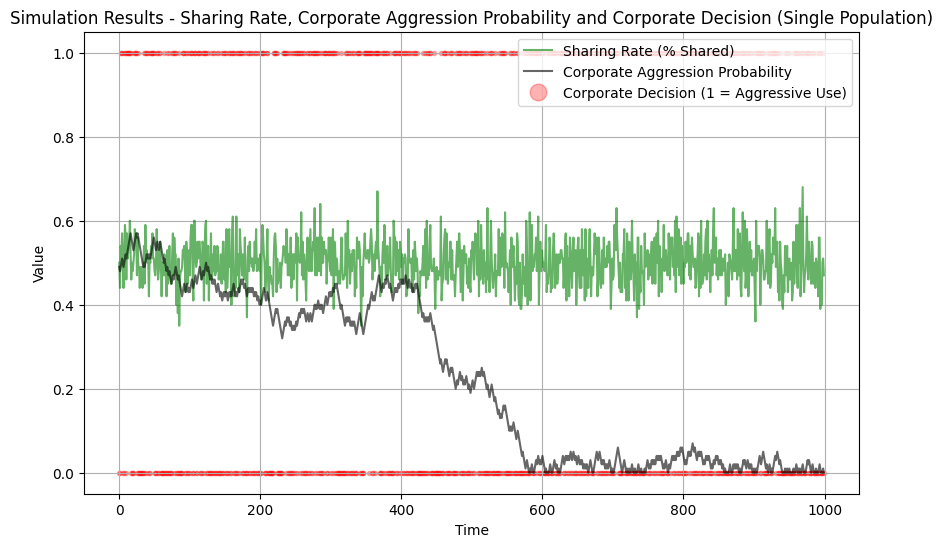

In [ ]:
# prompt: plot results
import matplotlib.pyplot as plt
# Assuming 'results' is a list of dictionaries as returned by the simulation
# Extract sharing rate and corporate aggression probability for plotting

sharing_rates = [result['sharing_rate'] for result in results]
corporate_aggression_probs = [result['corporate_aggression_prob'] for result in results]
corporate_decision = [result['corporate_decision_history'] for result in results]

# Create the plot
plt.figure(figsize=(10, 6))
plt.plot(sharing_rates, label='Sharing Rate (% Shared)', alpha = 0.6, color = 'green')
plt.plot(corporate_aggression_probs, label='Corporate Aggression Probability', alpha = 0.6, color = 'black')
plt.scatter(range(len(corporate_decision)),corporate_decision, label='Corporate Decision (1 = Aggressive Use)', alpha = 0.3, marker = '.', color='red')
plt.xlabel('Time')
plt.ylabel('Value')
plt.title('Sharing Rate, Corporate Aggression Probability and Corporate Decision (Single Population)')
plt.legend(markerscale=4, handleheight=1)
plt.grid(True)
plt.show()


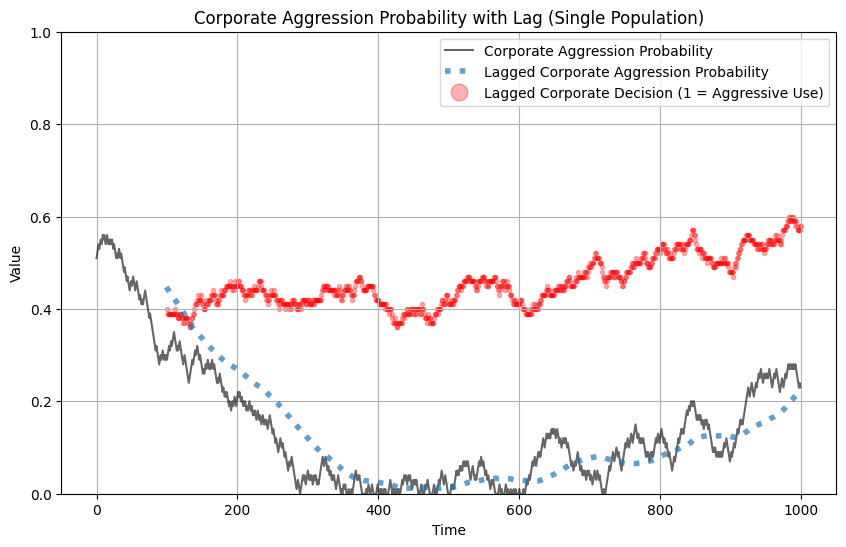

In [ ]:
# prompt: add a lag column to results_df - the average of the previous five corporate agression prob and plot the new lagged value as a separate line

# Calculate the lagged corporate aggression probability (5-iteration average)
results_df['lagged_corporate_aggression_prob'] = results_df['corporate_aggression_prob'].rolling(window=100).mean()
results_df['lagged_corporate_decision'] = results_df['corporate_decision_history'].rolling(window=100).mean()

# Plot the original and lagged corporate aggression probabilities
plt.figure(figsize=(10, 6))
plt.plot(results_df['corporate_aggression_prob'], label='Corporate Aggression Probability', alpha = 0.6, color = 'black')
plt.plot(results_df['lagged_corporate_aggression_prob'], label='Lagged Corporate Aggression Probability', alpha = 0.7,linestyle=':' , linewidth = 4)
plt.scatter(results_df['time'],results_df['lagged_corporate_decision'], label='Lagged Corporate Decision (1 = Aggressive Use)', color='red', alpha = 0.3, marker = '.')
plt.xlabel('Time')
plt.ylabel('Value')
plt.title('Corporate Aggression Probability with Lag (Single Population)')
plt.legend(markerscale=4, handleheight=1)
plt.ylim(0, 1)
plt.grid(True)
plt.show()


<ipython-input-42-6277f6afe32c>:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_counts = results_df.groupby('lagged_corporate_aggression_prob_binned')['lagged_corporate_aggression_prob_binned'].count()


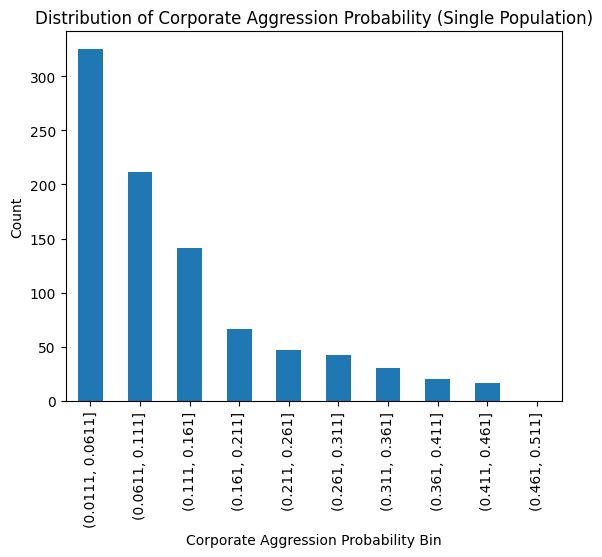

In [ ]:
# prompt: bin results_df['lagged_corporate_aggression_prob'] by bins with 0.1 width

# Assuming results_df is your DataFrame from the simulation
bins = np.arange(results_df['lagged_corporate_aggression_prob'].min(), results_df['lagged_corporate_aggression_prob'].max() + 0.1, 0.05)
results_df['lagged_corporate_aggression_prob_binned'] = pd.cut(results_df['lagged_corporate_aggression_prob'], bins=bins)

# Now, you can analyze the data by the created bins
# Example: Counting the number of rows in each bin:
bin_counts = results_df.groupby('lagged_corporate_aggression_prob_binned')['lagged_corporate_aggression_prob_binned'].count()
bin_counts.plot(kind='bar')
plt.xlabel('Corporate Aggression Probability Bin')
plt.ylabel('Count')
plt.title('Distribution of Corporate Aggression Probability (Single Population)')
plt.show()



## Lagged effect of random sharing

### Lagged Corporate Aggression Probability and Lagged Corporate Decision Making

In [ ]:
# Example usage in Jupyter Notebook
step_1b_results = []
for iteration in range(100):
  simulation = PrivacySimulation(num_individuals=100, initial_corporate_aggression=0.5, corporate_step_boldness=0.01)
  results = simulation.run_simulation(time=1000)
  for result in results:
    result['iteration'] = iteration
  step_1b_results.append(results)

#step_1b_results_df = pd.DataFrame(step_1b_results)


In [ ]:
##step_1b_results_df[0][0]

## function - convert to dataframe

In [ ]:
import numpy as np
import pandas as pd

def convert_to_dataframe(large_results_np):
    # Sample first entry to infer field names
    sample_entry = large_results_np[0][0]  # Assuming large_results_np[0][0] is a dictionary

    # Automatically detect field names
    field_names = list(sample_entry.keys())

    # Automatically determine dtype based on sample values
    def infer_dtype(value):
        if isinstance(value, int):
            return np.int32
        elif isinstance(value, float):
            return np.float64
        elif isinstance(value, str):
            return f'U{max(10, len(value))}'  # String with at least 10 characters
        else:
            return object  # Fallback for complex objects

    dtype = [(field, infer_dtype(sample_entry[field])) for field in field_names]

    # Convert list of dictionaries into structured NumPy array
    large_results_np_struc = np.array(
        [[tuple(item[field] for field in field_names) for item in row] for row in large_results_np],
        dtype=dtype
    )

    # Flatten the array to (1000*100, 5) for DataFrame compatibility
    flattened_array = large_results_np_struc.view(np.recarray).reshape(-1)

    # Convert the flattened array to a Pandas DataFrame
    df_large = pd.DataFrame(flattened_array, columns=large_results_np_struc.dtype.names)
    df_large['outer_iteration'] = np.repeat(np.arange(1, len(large_results_np) + 1), len(large_results_np[0]))

    return df_large



In [ ]:


# Example usage
# Assuming `large_results_np` is a list of lists with dictionaries
step_1b_results_df = convert_to_dataframe(step_1b_results)

# Print the first few rows to verify
print(step_1b_results_df.head())


   time  sharing_rate corporate_strategy  corporate_aggression_prob  \
0     1          0.54         aggressive                       0.51   
1     2          0.48         aggressive                       0.50   
2     3          0.51               fair                       0.51   
3     4          0.49         aggressive                       0.50   
4     5          0.51         aggressive                       0.51   

   corporate_decision_history  iteration  outer_iteration  
0                           1          0                1  
1                           0          0                1  
2                           1          0                1  
3                           0          0                1  
4                           1          0                1  


In [ ]:
# prompt: add a lag column to results_df - the average of the previous five corporate agression prob and plot the new lagged value as a separate line

import pandas as pd

# Assuming 'iteration' is a column and your DataFrame has it
# Apply the rolling mean calculation per iteration group, and ensure index alignment

# First, ensure that the 'iteration' column is part of the index
# If iteration is not an index, you can group by it directly.

step_1b_results_df['lagged_corporate_aggression_prob'] = step_1b_results_df.groupby('iteration')['corporate_aggression_prob'].apply(lambda x: x.rolling(window=100, min_periods=1).mean()).reset_index(level=0, drop=True)

step_1b_results_df['lagged_corporate_decision'] = step_1b_results_df.groupby('iteration')['corporate_decision_history'].apply(lambda x: x.rolling(window=100, min_periods=1).mean()).reset_index(level=0, drop=True)

# Verify the results
print(step_1b_results_df.head())


   time  sharing_rate corporate_strategy  corporate_aggression_prob  \
0     1          0.54         aggressive                       0.51   
1     2          0.48         aggressive                       0.50   
2     3          0.51               fair                       0.51   
3     4          0.49         aggressive                       0.50   
4     5          0.51         aggressive                       0.51   

   corporate_decision_history  iteration  outer_iteration  \
0                           1          0                1   
1                           0          0                1   
2                           1          0                1   
3                           0          0                1   
4                           1          0                1   

   lagged_corporate_aggression_prob  lagged_corporate_decision  
0                          0.510000                   1.000000  
1                          0.505000                   0.500000  
2          

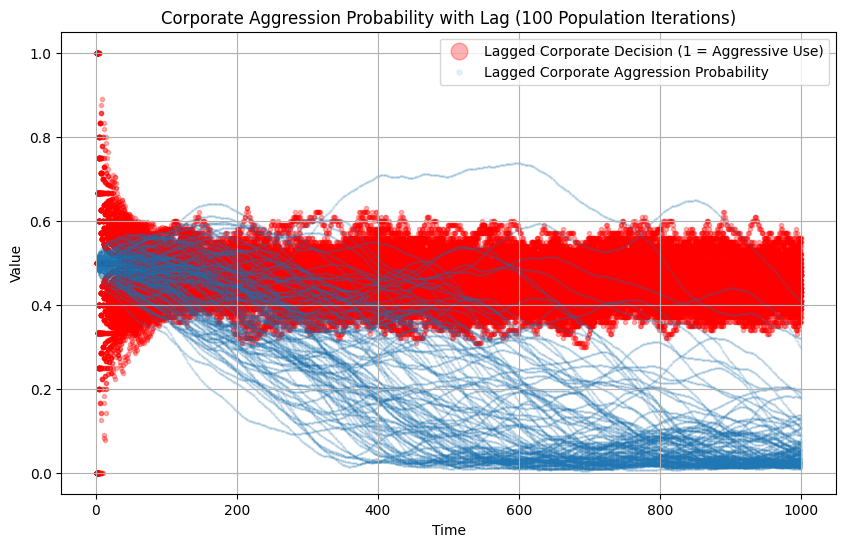

In [ ]:
import matplotlib.pyplot as plt

# Assuming step_1b_results_df is your DataFrame with the relevant columns

# Plot the original and lagged corporate aggression probabilities for each iteration
plt.figure(figsize=(10, 6))

# Plot the lagged corporate decision
plt.scatter(step_1b_results_df['time'], step_1b_results_df['lagged_corporate_decision'], label='Lagged Corporate Decision (1 = Aggressive Use)', color='red', alpha=0.3, marker = '.')

# Plot the corporate aggression probability
#plt.plot(step_1b_results_df['time'], step_1b_results_df['corporate_aggression_prob'], label='Corporate Aggression Probability', alpha=0.7, color = 'black')

# Plot the lagged corporate aggression probability
#plt.plot(step_1b_results_df['time'], step_1b_results_df['lagged_corporate_aggression_prob'], label='Lagged Corporate Aggression Probability', alpha=0.8,linestyle=':')

# Plot using scatter with line style
plt.scatter(step_1b_results_df['time'], step_1b_results_df['lagged_corporate_aggression_prob'], label='Lagged Corporate Aggression Probability', alpha=0.1, marker='.', s=3)

# To connect the scatter points with a line
#plt.plot(step_1b_results_df['time'], step_1b_results_df['lagged_corporate_aggression_prob'], label='Lagged Corporate Aggression Probability', linestyle=':', linewidth = 2, alpha=0.8)


# Adding labels and title
plt.xlabel('Time')
plt.ylabel('Value')
plt.title('Corporate Aggression Probability with Lag (100 Population Iterations)')

# Show legend
plt.legend(markerscale=4, handleheight=1)

# Display the grid
plt.grid(True)

# Display the plot
plt.show()


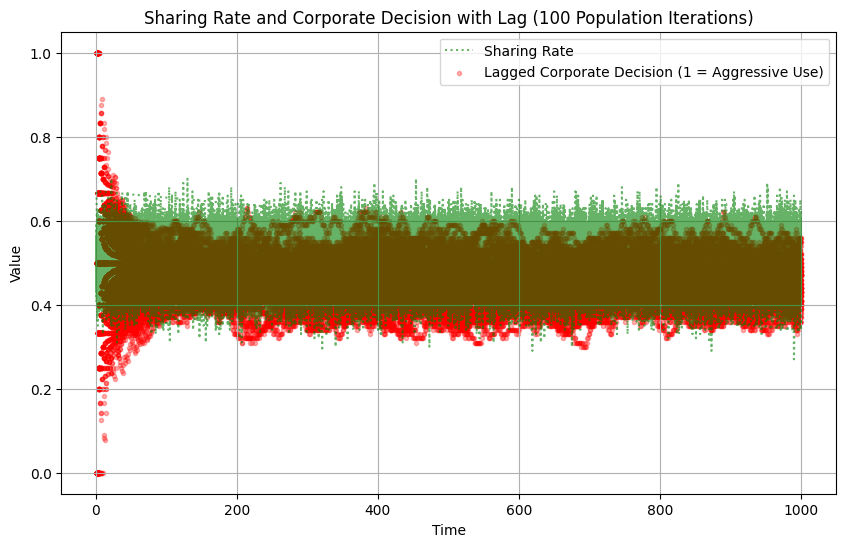

In [ ]:
import matplotlib.pyplot as plt

# Assuming step_1b_results_df is your DataFrame with the relevant columns

# Plot the original and lagged corporate aggression probabilities for each iteration
plt.figure(figsize=(10, 6))

# Plot the corporate aggression probability
#plt.plot(step_1b_results_df['time'], step_1b_results_df['corporate_aggression_prob'], label='Corporate Aggression Probability', alpha=0.7, color = 'black')

# Plot the lagged corporate aggression probability
#plt.plot(step_1b_results_df['time'], step_1b_results_df['lagged_corporate_aggression_prob'], label='Lagged Corporate Aggression Probability', alpha=0.8,linestyle=':')

# Plot using scatter with line style
#plt.scatter(step_1b_results_df['time'], step_1b_results_df['lagged_corporate_aggression_prob'], label='Lagged Corporate Aggression Probability', alpha=0.1, marker='.')

# To connect the scatter points with a line
plt.plot(step_1b_results_df['time'], step_1b_results_df['sharing_rate'],label='Sharing Rate', linestyle=':', alpha=0.6, color='green')


# Plot the lagged corporate decision
plt.scatter(step_1b_results_df['time'], step_1b_results_df['lagged_corporate_decision'], label='Lagged Corporate Decision (1 = Aggressive Use)', color='red', alpha=0.3, marker = '.')

# Adding labels and title
plt.xlabel('Time')
plt.ylabel('Value')
plt.title('Sharing Rate and Corporate Decision with Lag (100 Population Iterations)')

# Show legend
plt.legend()

# Display the grid
plt.grid(True)

# Display the plot
plt.show()


## Step 1c - manual stepped runs

### Lagged Corporate Aggression Probability and Lagged Corporate Decision Making at Different levels of B

In [ ]:
# Example usage in Jupyter Notebook
step_1c_results = []
for corporate_step_boldness in [0.001,0.005,0.01,0.05,0.1,0.5]:
  for iteration in range(100):
    simulation = PrivacySimulation(num_individuals=100, initial_corporate_aggression=0.5, corporate_step_boldness=corporate_step_boldness)
    results = simulation.run_simulation(time=1000)
    for result in results:
      result['iteration'] = iteration
      result['corporate_step_boldness'] = corporate_step_boldness
    step_1c_results.append(results)

#step_1b_results_df = pd.DataFrame(step_1b_results)


# Example usage
# Assuming `large_results_np` is a list of lists with dictionaries
step_1c_results_df = convert_to_dataframe(step_1c_results)

# Print the first few rows to verify
print(step_1c_results_df.head())


   time  sharing_rate corporate_strategy  corporate_aggression_prob  \
0     1          0.43         aggressive                      0.499   
1     2          0.51         aggressive                      0.500   
2     3          0.52         aggressive                      0.501   
3     4          0.50               fair                      0.500   
4     5          0.54               fair                      0.501   

   corporate_decision_history  iteration  corporate_step_boldness  \
0                           0          0                    0.001   
1                           1          0                    0.001   
2                           1          0                    0.001   
3                           0          0                    0.001   
4                           1          0                    0.001   

   outer_iteration  
0                1  
1                1  
2                1  
3                1  
4                1  


In [ ]:
# prompt: add a lag column to results_df - the average of the previous five corporate agression prob and plot the new lagged value as a separate line

import pandas as pd

# Assuming 'iteration' is a column and your DataFrame has it
# Apply the rolling mean calculation per iteration group, and ensure index alignment

# First, ensure that the 'iteration' column is part of the index
# If iteration is not an index, you can group by it directly.

# Compute rolling mean per iteration using transform instead of apply
step_1c_results_df['lagged_corporate_aggression_prob'] = (
    step_1c_results_df.groupby('iteration')['corporate_aggression_prob']
    .transform(lambda x: x.rolling(window=100, min_periods=1).mean())
)

step_1c_results_df['lagged_corporate_decision'] = (
    step_1c_results_df.groupby('iteration')['corporate_decision_history']
    .transform(lambda x: x.rolling(window=100, min_periods=1).mean())
)

# Verify the results
print(step_1c_results_df.head())


   time  sharing_rate corporate_strategy  corporate_aggression_prob  \
0     1          0.43         aggressive                      0.499   
1     2          0.51         aggressive                      0.500   
2     3          0.52         aggressive                      0.501   
3     4          0.50               fair                      0.500   
4     5          0.54               fair                      0.501   

   corporate_decision_history  iteration  corporate_step_boldness  \
0                           0          0                    0.001   
1                           1          0                    0.001   
2                           1          0                    0.001   
3                           0          0                    0.001   
4                           1          0                    0.001   

   outer_iteration  lagged_corporate_aggression_prob  \
0                1                            0.4990   
1                1                            

In [ ]:
# Check if first value of each iteration is identical before and after transformation
check = step_1c_results_df.groupby('iteration').head(1)[['corporate_decision_history', 'lagged_corporate_decision']]
print(check)


       corporate_decision_history  lagged_corporate_decision
0                               0                        0.0
1000                            0                        0.0
2000                            0                        0.0
3000                            0                        0.0
4000                            0                        0.0
...                           ...                        ...
95000                           1                        1.0
96000                           0                        0.0
97000                           1                        1.0
98000                           0                        0.0
99000                           1                        1.0

[100 rows x 2 columns]


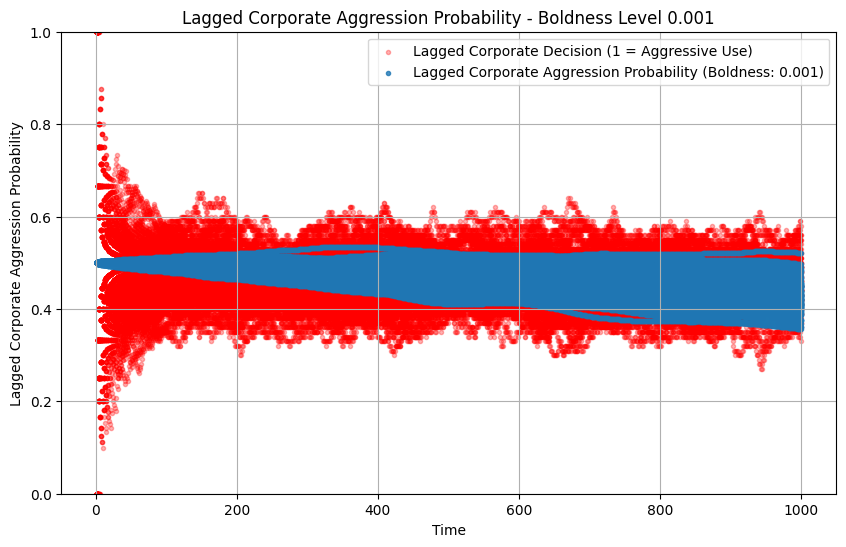

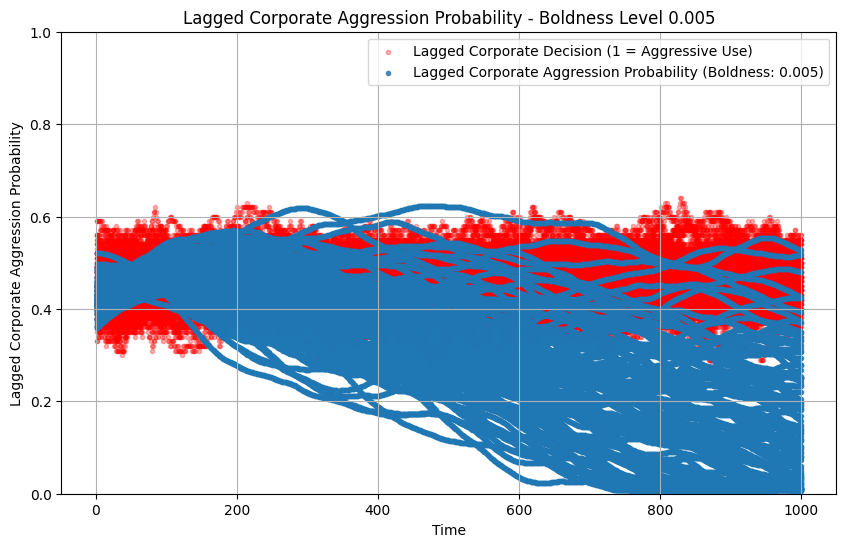

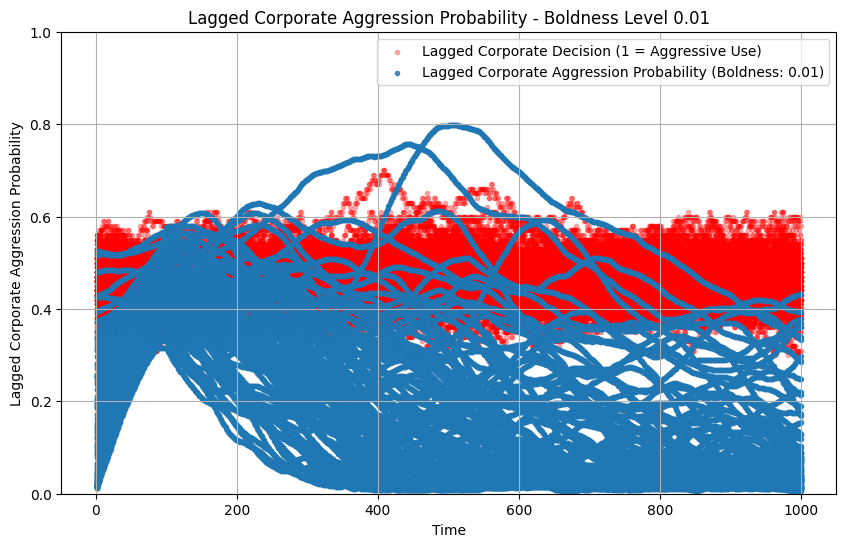

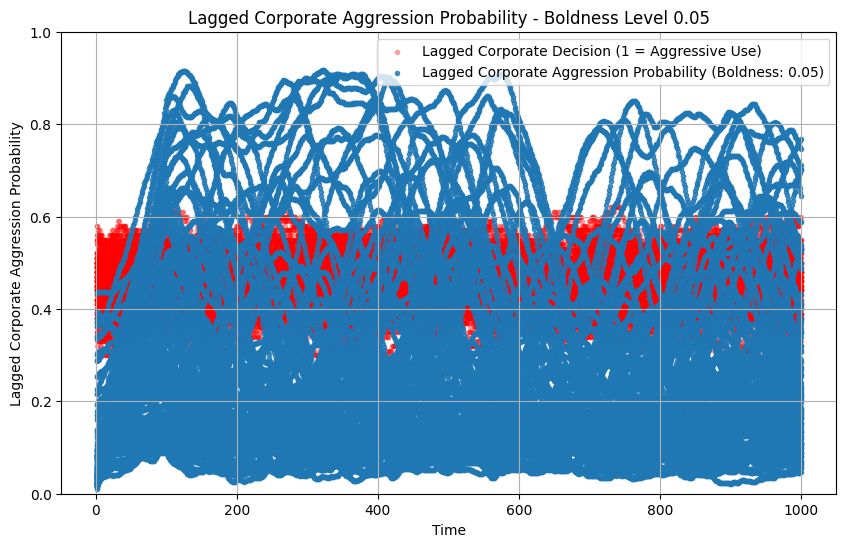

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


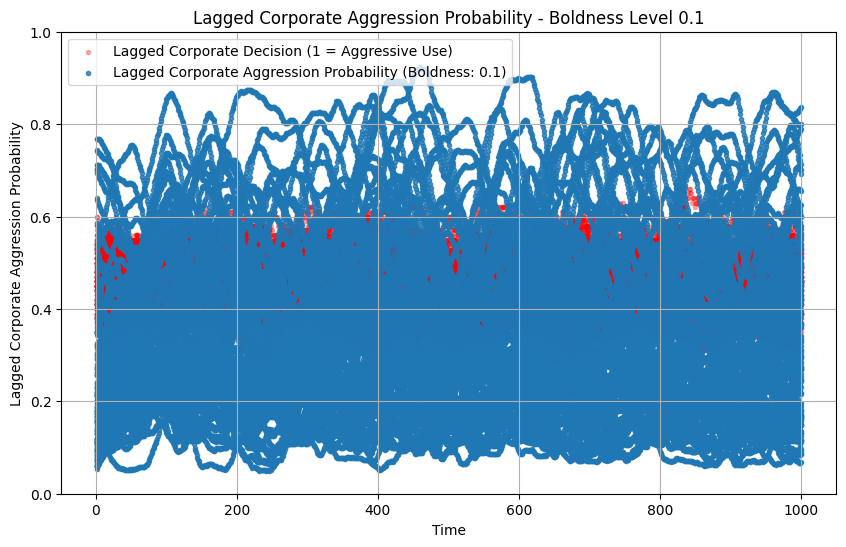

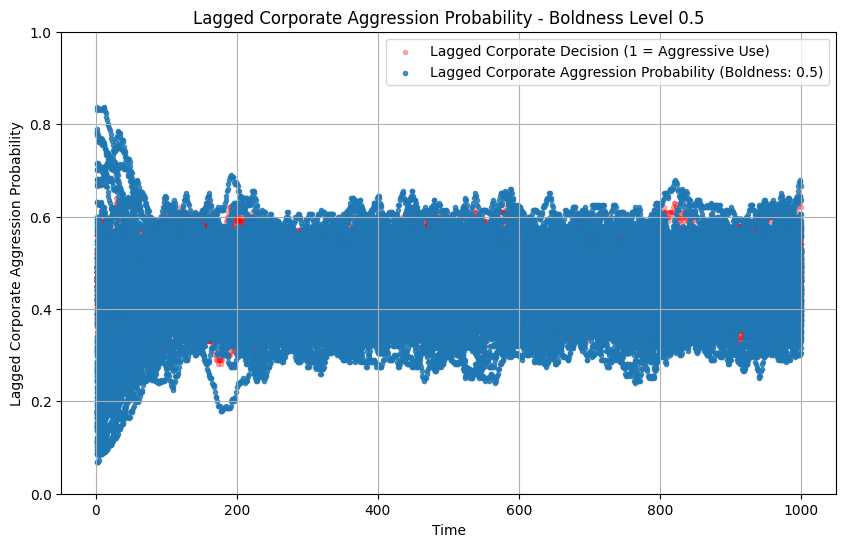

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'corporate_step_boldness' is a column in your DataFrame
unique_boldness_levels = step_1c_results_df['corporate_step_boldness'].unique()

# Create a separate plot for each unique level of corporate_step_boldness
for level in unique_boldness_levels:
    # Filter the data for the current level of corporate_step_boldness
    level_data = step_1c_results_df[step_1c_results_df['corporate_step_boldness'] == level]

    # Create a new plot
    plt.figure(figsize=(10, 6))
    # Plot the lagged corporate decision
    plt.scatter(level_data['time'], level_data['lagged_corporate_decision'], label='Lagged Corporate Decision (1 = Aggressive Use)', color='red', alpha=0.3, marker = '.')

    plt.scatter(level_data['time'], level_data['lagged_corporate_aggression_prob'],
                label=f'Lagged Corporate Aggression Probability (Boldness: {level})',
                alpha=0.8, marker='.')



    # Add labels and title
    plt.xlabel('Time')
    plt.ylabel('Lagged Corporate Aggression Probability')
    plt.title(f'Lagged Corporate Aggression Probability - Boldness Level {level}')
    plt.ylim(0, 1)
    # Show the legend
    plt.legend()

    # Display the plot
    plt.grid(True)
    plt.show()


## matrix plot - different combinations of stepped function

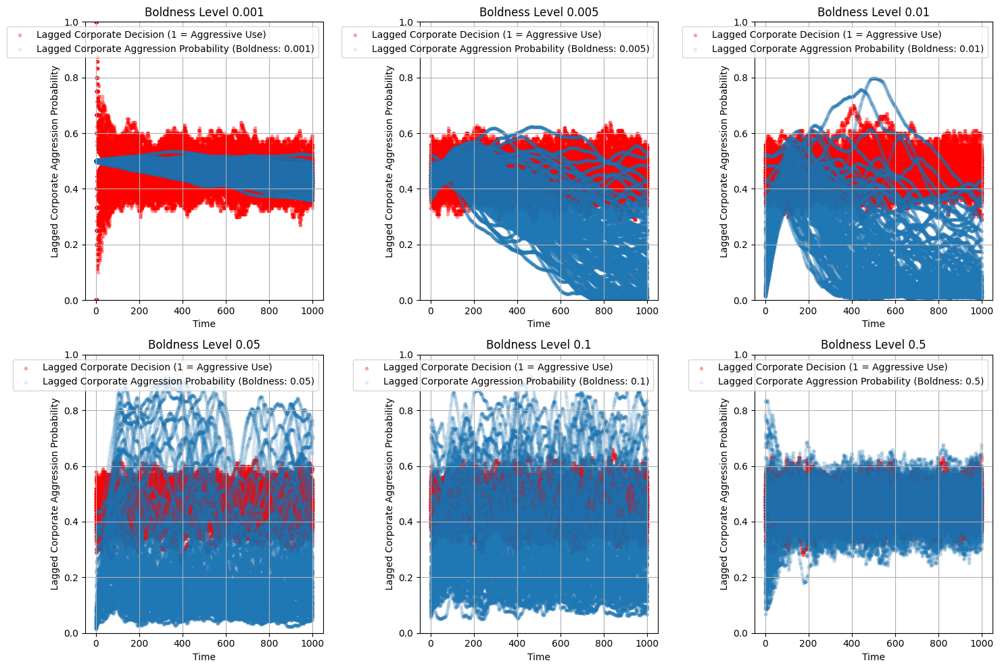

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'corporate_step_boldness' is a column in your DataFrame
unique_boldness_levels = step_1c_results_df['corporate_step_boldness'].unique()

# Determine the number of rows and columns for the grid layout
n_plots = len(unique_boldness_levels)
n_cols = 3  # Number of columns in the grid (adjust as needed)
n_rows = int(np.ceil(n_plots / n_cols))  # Number of rows in the grid

# Create the subplots grid
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))

# Flatten the axes array to easily index it
axes = axes.flatten()

# Create a separate plot for each unique level of corporate_step_boldness
for i, level in enumerate(unique_boldness_levels):
    # Filter the data for the current level of corporate_step_boldness
    level_data = step_1c_results_df[step_1c_results_df['corporate_step_boldness'] == level]

    # Get the current axis to plot on
    ax = axes[i]

    # Scatter plot and line plot
    ax.scatter(level_data['time'], level_data['lagged_corporate_decision'],
               label='Lagged Corporate Decision (1 = Aggressive Use)', color='red', alpha=0.3, marker = '.')
    ax.scatter(level_data['time'], level_data['lagged_corporate_aggression_prob'],
               label=f'Lagged Corporate Aggression Probability (Boldness: {level})',
               alpha=0.1, marker='.')
    # Add labels and title
    ax.set_xlabel('Time')
    ax.set_ylabel('Lagged Corporate Aggression Probability')
    ax.set_title(f'Boldness Level {level}')
    ax.set_ylim(0, 1)
    # Show legend
    ax.legend()

    # Enable grid
    ax.grid(True)

# Remove any empty subplots if there are fewer levels than the total number of subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout to avoid overlapping elements
plt.tight_layout()
plt.show()


## Simulate correlations between sharing rate and corporate aggression for 100 population iterations

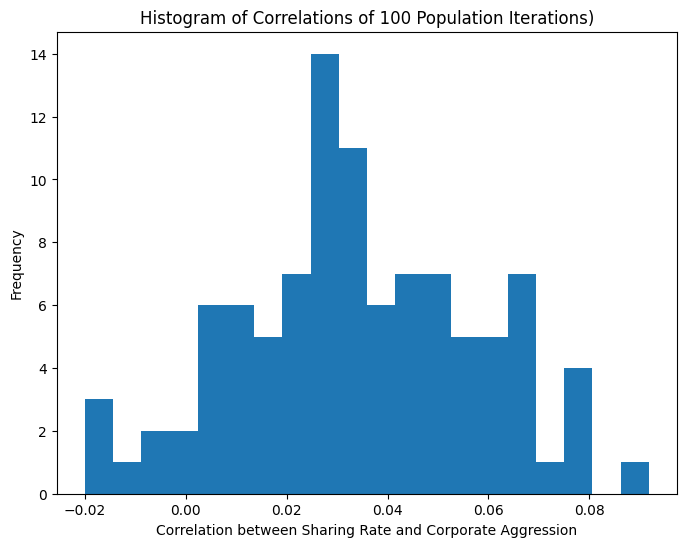

In [ ]:
# prompt: simulate this 100 times, for each time check the correlation between sharing rate and corporate aggression. and plot the correlations in a histogram. simulation.run_simulation(num_iterations=2000)

correlations = []
large_results_df = []
for iteration in range(100):
  simulation = PrivacySimulation(num_individuals=100, initial_corporate_aggression=0.5)
  results = simulation.run_simulation(time=1000)
  for result in results:
    result['iteration'] = iteration
  large_results_df.append(results)
  results_df = pd.DataFrame(results)
  correlation = results_df['sharing_rate'].corr(results_df['corporate_aggression_prob'])
  correlations.append(correlation)

# Plot the correlations in a histogram
plt.figure(figsize=(8, 6))
plt.hist(correlations, bins=20)
plt.xlabel('Correlation between Sharing Rate and Corporate Aggression')
plt.ylabel('Frequency')
plt.title('Histogram of Correlations of 100 Population Iterations)')
plt.show()


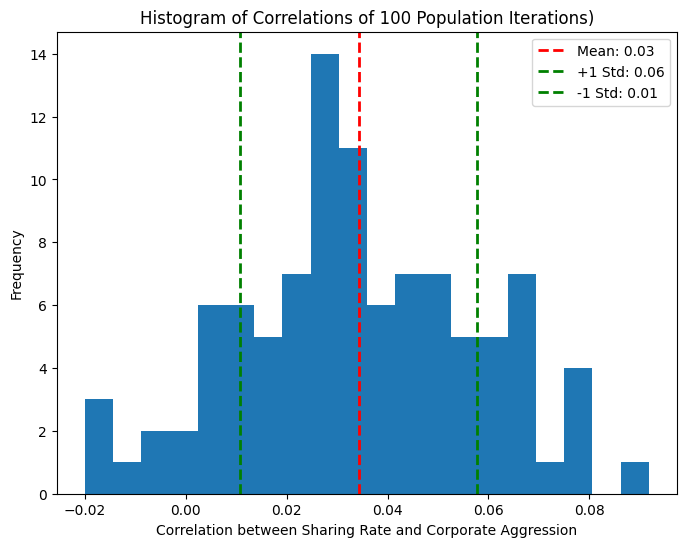

In [ ]:
# prompt: create a histogram of the object correlations showing the mean and std on the plot

import matplotlib.pyplot as plt

# Assuming 'correlations' is the list of correlation values from your simulation
plt.figure(figsize=(8, 6))
plt.hist(correlations, bins=20)
plt.xlabel('Correlation between Sharing Rate and Corporate Aggression')
plt.ylabel('Frequency')
plt.title('Histogram of Correlations of 100 Population Iterations)')
# Calculate the mean and standard deviation of the correlations
mean_correlation = np.mean(correlations)
std_correlation = np.std(correlations)


# Add the mean and std to the plot
plt.axvline(mean_correlation, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_correlation:.2f}')
plt.axvline(mean_correlation + std_correlation, color='green', linestyle='dashed', linewidth=2, label=f'+1 Std: {mean_correlation + std_correlation:.2f}')
plt.axvline(mean_correlation - std_correlation, color='green', linestyle='dashed', linewidth=2, label=f'-1 Std: {mean_correlation - std_correlation:.2f}')

plt.legend()
plt.show()


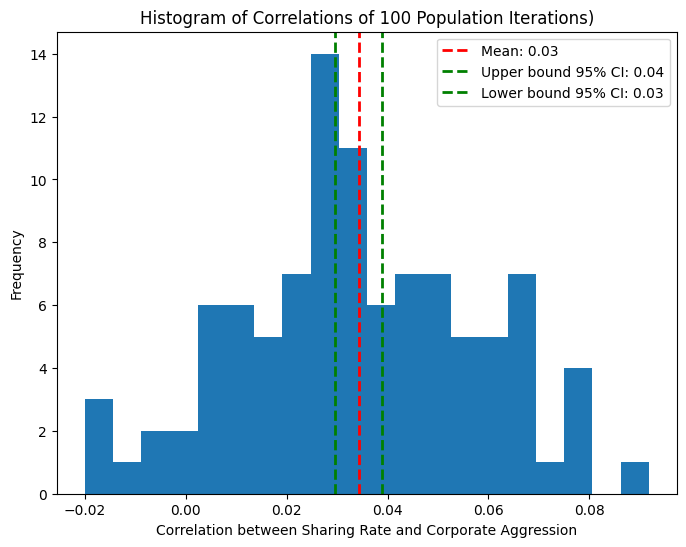

In [ ]:
# prompt: create a histogram of the object correlations showing the mean and std on the plot

import matplotlib.pyplot as plt

# Assuming 'correlations' is the list of correlation values from your simulation
plt.figure(figsize=(8, 6))
plt.hist(correlations, bins=20)
plt.xlabel('Correlation between Sharing Rate and Corporate Aggression')
plt.ylabel('Frequency')
plt.title('Histogram of Correlations of 100 Population Iterations)')
# Calculate the mean and standard deviation of the correlations
mean_correlation = np.mean(correlations)
std_correlation = 1.96 * np.std(correlations)/np.sqrt(len(correlations))


# Add the mean and std to the plot
plt.axvline(mean_correlation, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_correlation:.2f}')
plt.axvline(mean_correlation + std_correlation, color='green', linestyle='dashed', linewidth=2, label=f'Upper bound 95% CI: {mean_correlation + std_correlation:.2f}')
plt.axvline(mean_correlation - std_correlation, color='green', linestyle='dashed', linewidth=2, label=f'Lower bound 95% CI: {mean_correlation - std_correlation:.2f}')

plt.legend()
plt.show()


## processing large results df

In [ ]:


# Example usage
# Assuming `large_results_np` is a list of lists with dictionaries
df_large = convert_to_dataframe(large_results_df)

# Print the first few rows to verify
print(df_large.head())


   time  sharing_rate corporate_strategy  corporate_aggression_prob  \
0     1          0.54         aggressive                       0.51   
1     2          0.46               fair                       0.50   
2     3          0.45               fair                       0.49   
3     4          0.53               fair                       0.50   
4     5          0.41         aggressive                       0.49   

   corporate_decision_history  iteration  outer_iteration  
0                           1          0                1  
1                           0          0                1  
2                           0          0                1  
3                           1          0                1  
4                           0          0                1  


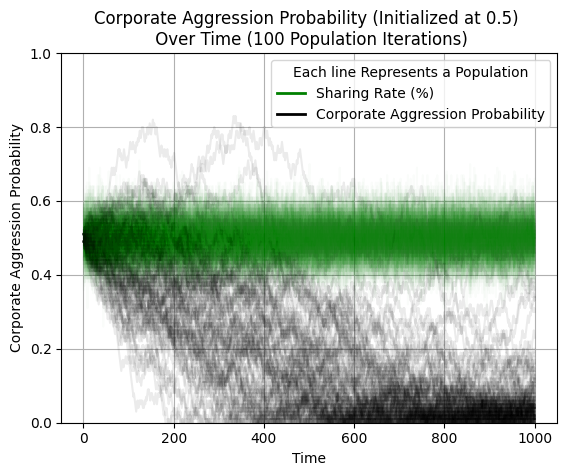

In [ ]:
# prompt: plot sharing rate and corporate aggression from df_large with a separate line for each outer iteration. Use iteration as the x axis

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D


# Assuming df_large is your DataFrame
for population in df_large['iteration'].unique():
  df_subset = df_large[df_large['iteration'] == population]
  #plt.plot(df_subset['iteration'], df_subset['sharing_rate'], label=f'Outer Iteration {outer_iteration}', alpha = 0.1)
  plt.plot(df_subset['time'], df_subset['sharing_rate'], label=f'Population {population}', alpha = 0.02,color = 'green')

  plt.plot(df_subset['time'], df_subset['corporate_aggression_prob'], label=f'Corporate Aggression (Outer Iteration {outer_iteration})', alpha=0.08, color = 'black')

plt.xlabel('Time')
plt.ylabel('Corporate Aggression Probability')
plt.title('Corporate Aggression Probability (Initialized at 0.5) \n Over Time (100 Population Iterations)')
plt.grid(True)
plt.ylim(0, 1)

# Create dummy legend elements
legend_elements = [
    Line2D([0], [0], color='green', lw=2, label='Sharing Rate (%)'),
    Line2D([0], [0], color='black', lw=2, label='Corporate Aggression Probability')
]

# Add legend to the plot (including existing plot and dummy legend)
plt.legend(handles=legend_elements, title="Each line Represents a Population")

plt.show()


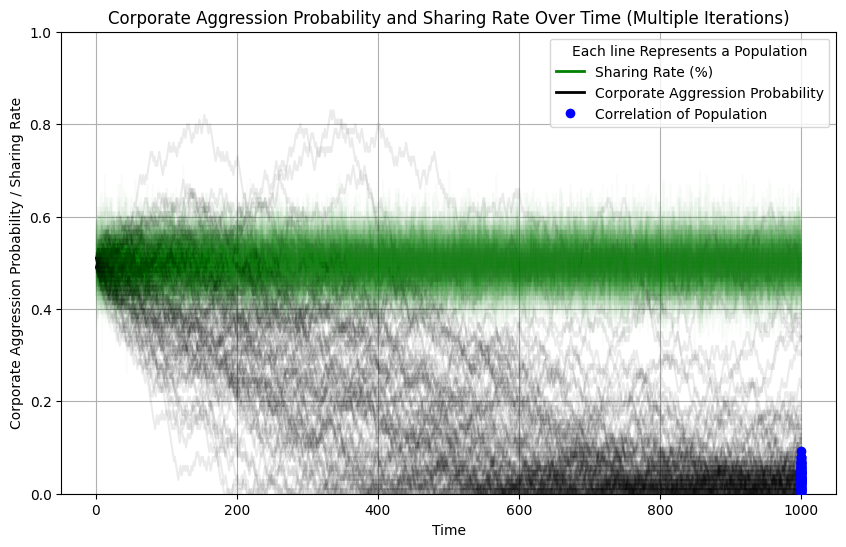

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# Assuming df_large is your DataFrame
# Assuming you want to plot the correlation for each population at the end of each line
# Calculate correlation for each population at the end of the plot

# Create the plot
plt.figure(figsize=(10, 6))
pos = 0
# Loop through each population and plot sharing rate and corporate aggression probability
for population in df_large['iteration'].unique():
    cor_point = correlations[pos]
    df_subset = df_large[df_large['iteration'] == population]

    # Plot sharing rate (left y-axis)
    plt.plot(df_subset['time'], df_subset['sharing_rate'], label=f'Population {population}', alpha=0.02, color='green')

    # Plot corporate aggression probability (left y-axis)
    plt.plot(df_subset['time'], df_subset['corporate_aggression_prob'], label=f'Corporate Aggression (Population {population})', alpha=0.08, color='black')

    # Plot correlation dot at the end of the line (right y-axis)
    plt.scatter(df_subset['time'].iloc[-1], cor_point, color='blue',marker='o', zorder=5)  # Blue dot for correlation
    pos += 1

# Add legend to the plot
# Set labels and title for the plot
plt.xlabel('Time')
plt.ylabel('Corporate Aggression Probability / Sharing Rate', color='black')
plt.title('Corporate Aggression Probability and Sharing Rate Over Time (Multiple Iterations)')
plt.grid(True)
plt.ylim(0, 1)

# Create dummy legend elements
legend_elements = [
    Line2D([0], [0], color='green', lw=2, label='Sharing Rate (%)'),
    Line2D([0], [0], color='black', lw=2, label='Corporate Aggression Probability'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=8, label='Correlation of Population', lw=0)  # Blue dot for correlation

]

# Add legend to the plot (including existing plot and dummy legend)
plt.legend(handles=legend_elements, title="Each line Represents a Population")

# Show the plot
plt.show()


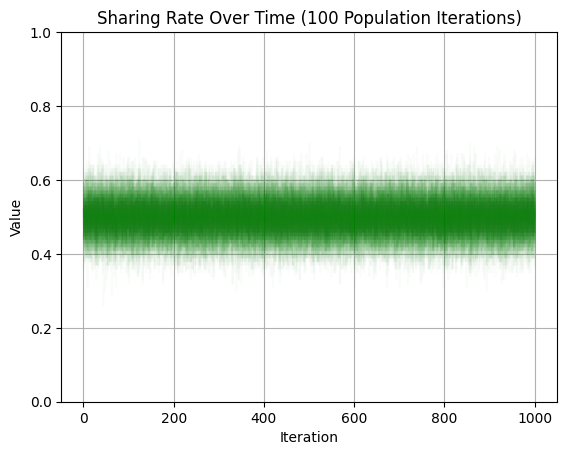

In [ ]:
# prompt: plot sharing rate and corporate aggression from df_large with a separate line for each outer iteration. Use iteration as the x axis

import matplotlib.pyplot as plt

# Assuming df_large is your DataFrame
for population in df_large['iteration'].unique():
  df_subset = df_large[df_large['iteration'] == population]
  plt.plot(df_subset['time'], df_subset['sharing_rate'], label=f'Population {population}', alpha = 0.02,color = 'green')
  #plt.plot(df_subset['iteration'], df_subset['corporate_aggression_prob'], label=f'Corporate Aggression (Outer Iteration {outer_iteration})', alpha=0.1)


plt.xlabel('Iteration')
plt.ylabel('Value')
plt.title('Sharing Rate Over Time (100 Population Iterations)')
plt.grid(True)
plt.ylim(0, 1)
plt.show()


#Part Two - Correlations of Sharing Rate and Aggression Prob

## Plotting correlations against Initial corporate aggression

In [ ]:
# prompt: simulate this 100 times for initial_gorporate_aggression going from 0.01 to 1.00 for each time check the correlation between sharing rate and corporate aggression. and plot the correlations against initial corporate aggression in a line chart with confidence intervals. simulation.run_simulation(num_iterations=2000)

correlations_data = []
vlarge_results_df = []
for initial_aggression in np.linspace(0.01, 1.00, 100):
  correlations = []
  corporate_decisions = []
  for population in range(100):
    simulation = PrivacySimulation(num_individuals=100, initial_corporate_aggression=initial_aggression)
    results = simulation.run_simulation(time=1000)
    for result in results:
      result['init_aggression'] = initial_aggression
      result['iteration'] = population
    vlarge_results_df.append(results)
    results_df = pd.DataFrame(results)
    results_df['corporate_decision_history'] = results_df['corporate_decision_history'].astype(int)
    correlation = results_df['sharing_rate'].corr(results_df['corporate_aggression_prob'])
    correlations.append(correlation)
    corporate_aggr_decisions = results_df['corporate_decision_history'].sum()/len(results_df['corporate_decision_history'])


  # Calculate mean and confidence interval
  mean_correlation = np.mean(correlations)
  std_correlation = np.std(correlations)
  confidence_interval = 1.96 * (std_correlation / np.sqrt(len(correlations)))  # 95% CI

  results_df['corporate_decision_history']
  correlations_data.append({
      'initial_aggression': initial_aggression,
      'mean_correlation': mean_correlation,
      'confidence_interval': confidence_interval,
      'correlation_stdev': std_correlation,
      'corporate_decision_history': corporate_aggr_decisions
  })


# Create a DataFrame from the correlations data
correlations_df = pd.DataFrame(correlations_data)




In [ ]:
# prompt: create a lagged corporate_aggr_decisions from correlation_df window = 10

# Assuming correlation_df is your DataFrame and it has columns 'iteration' and 'corporate_aggr_decisions'
# Group by 'iteration' and apply a rolling window with a window size of 10

correlations_df['lagged_corporate_decision_history'] = (
    correlations_df['corporate_decision_history']
    .transform(lambda x: x.rolling(window=10, min_periods=1).mean())
)


In [ ]:
correlations_df.shape

(100, 5)

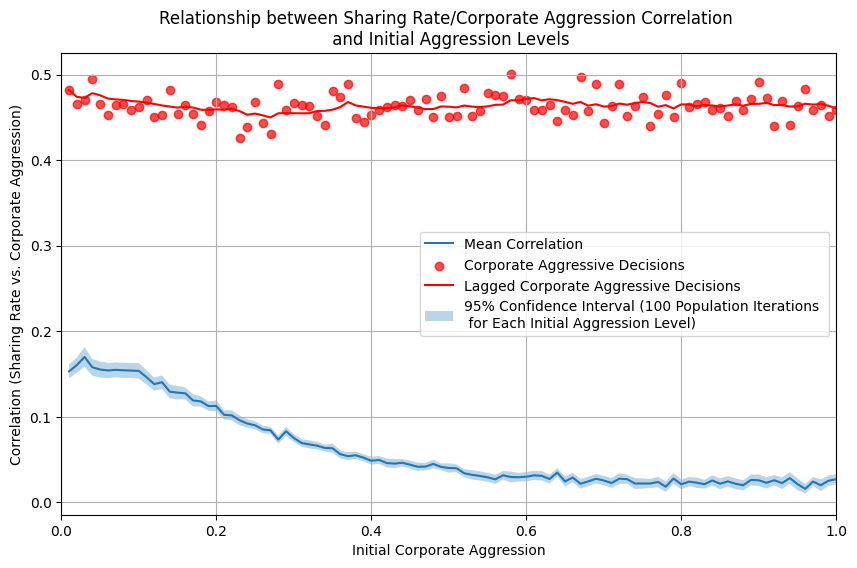

In [ ]:
# Plot the correlations against initial corporate aggression
plt.figure(figsize=(10, 6))
plt.plot(correlations_df['initial_aggression'], correlations_df['mean_correlation'], label='Mean Correlation')
plt.scatter(correlations_df['initial_aggression'], correlations_df['corporate_decision_history'], label='Corporate Aggressive Decisions', alpha = 0.7,color='red')
plt.plot(correlations_df['initial_aggression'], correlations_df['lagged_corporate_decision_history'], label='Lagged Corporate Aggressive Decisions', color = 'red')

plt.fill_between(
    correlations_df['initial_aggression'],
    correlations_df['mean_correlation'] - correlations_df['confidence_interval'],
    correlations_df['mean_correlation'] + correlations_df['confidence_interval'],
    alpha=0.3,
    label='95% Confidence Interval (100 Population Iterations \n for Each Initial Aggression Level)'
)


plt.xlabel('Initial Corporate Aggression')
plt.ylabel('Correlation (Sharing Rate vs. Corporate Aggression)')
plt.title('Relationship between Sharing Rate/Corporate Aggression Correlation \n and Initial Aggression Levels')
#plt.ylim(0, 1)  # Set the y-axis limits to 0 and 1
plt.xlim(0, 1)  # Set the y-axis limits to 0 and 1

plt.legend()
plt.grid(True)
plt.show()

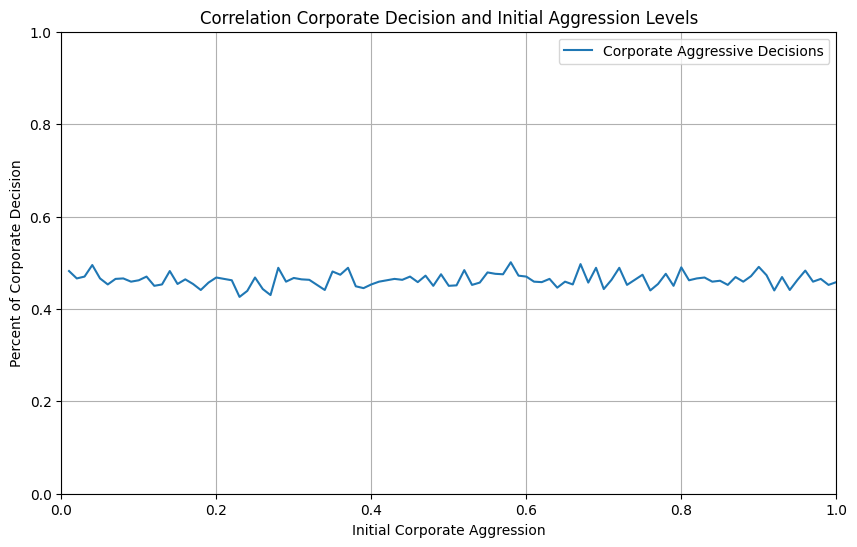

In [ ]:
# Plot the correlations against initial corporate aggression
plt.figure(figsize=(10, 6))
plt.plot(correlations_df['initial_aggression'], correlations_df['corporate_decision_history'], label='Corporate Aggressive Decisions')
plt.xlabel('Initial Corporate Aggression')
plt.ylabel('Percent of Corporate Decision')
plt.title('Correlation Corporate Decision and Initial Aggression Levels')
plt.legend()
plt.grid(True)
plt.ylim(0, 1)  # Set the y-axis limits to 0 and 1
plt.xlim(0, 1)  # Set the y-axis limits to 0 and 1

plt.show()

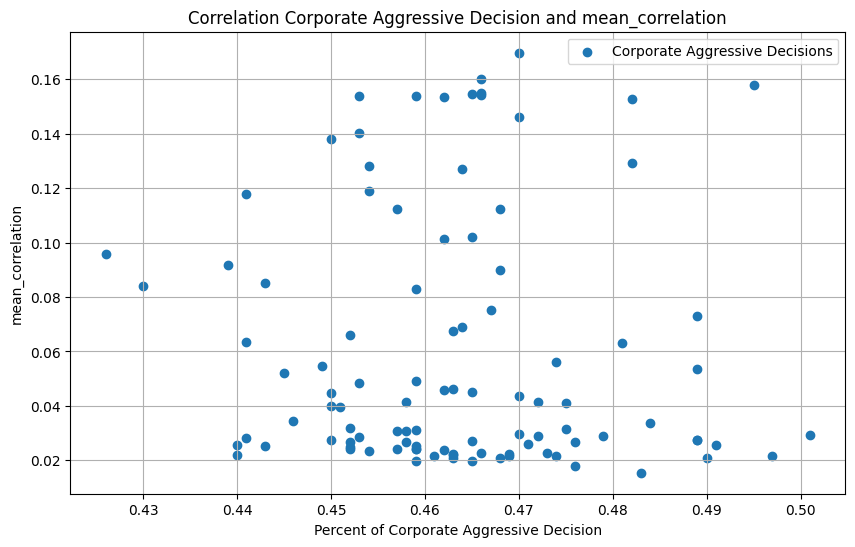

In [ ]:
# Plot the correlations against initial corporate aggression
plt.figure(figsize=(10, 6))
plt.scatter(correlations_df['corporate_decision_history'],correlations_df['mean_correlation'],  label='Corporate Aggressive Decisions')
plt.ylabel('mean_correlation')
plt.xlabel('Percent of Corporate Aggressive Decision')
plt.title('Correlation Corporate Aggressive Decision and mean_correlation')
plt.legend()
plt.grid(True)
#plt.ylim(0, 1)  # Set the y-axis limits to 0 and 1
#plt.xlim(0, 1)  # Set the y-axis limits to 0 and 1

plt.show()

In [ ]:
correlations_df.columns

Index(['initial_aggression', 'mean_correlation', 'confidence_interval',
       'correlation_stdev', 'corporate_decision_history',
       'lagged_corporate_aggr_decisions', 'lagged_corporate_decision_history'],
      dtype='object')

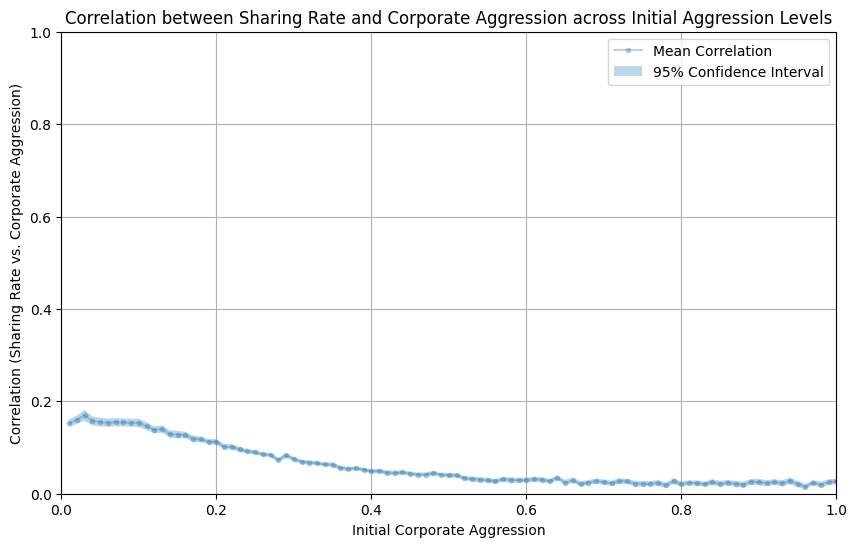

In [ ]:
# prompt: in the code below also include the dots in the plot. # Plot the correlations against initial corporate aggression

# Plot the correlations against initial corporate aggression
plt.figure(figsize=(10, 6))
plt.plot(correlations_df['initial_aggression'], correlations_df['mean_correlation'], label='Mean Correlation', marker='.', alpha=0.3)  # Added marker='o' for dots
plt.fill_between(
    correlations_df['initial_aggression'],
    correlations_df['mean_correlation'] - correlations_df['confidence_interval'],
    correlations_df['mean_correlation'] + correlations_df['confidence_interval'],
    alpha=0.3,
    label='95% Confidence Interval'
)
plt.xlabel('Initial Corporate Aggression')
plt.ylabel('Correlation (Sharing Rate vs. Corporate Aggression)')
plt.title('Correlation between Sharing Rate and Corporate Aggression across Initial Aggression Levels')
plt.legend()
plt.ylim(0, 1)  # Set the y-axis limits to 0 and 1
plt.xlim(0, 1)  # Set the y-axis limits to 0 and 1
plt.grid(True)
plt.show()


### Processing vlarge_df

In [ ]:
# Example usage
# Assuming `large_results_np` is a list of lists with dictionaries
df_vlarge = convert_to_dataframe(vlarge_results_df)

# Print the first few rows to verify
print(df_vlarge.head())


   time  sharing_rate corporate_strategy  corporate_aggression_prob  \
0     1          0.43               fair                       0.00   
1     2          0.49               fair                       0.00   
2     3          0.54               fair                       0.01   
3     4          0.51               fair                       0.02   
4     5          0.43               fair                       0.01   

   corporate_decision_history  init_aggression  iteration  outer_iteration  
0                           0             0.01          0                1  
1                           0             0.01          0                1  
2                           1             0.01          0                1  
3                           1             0.01          0                1  
4                           0             0.01          0                1  


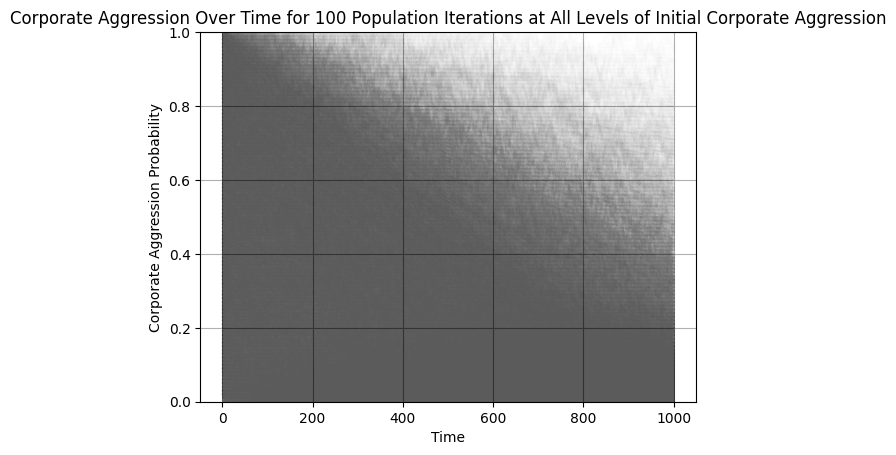

In [ ]:
# prompt: plot sharing rate and corporate aggression from df_large with a separate line for each outer iteration. Use iteration as the x axis

import matplotlib.pyplot as plt

# Assuming df_large is your DataFrame
for population in df_vlarge['iteration'].unique():
  df_subset = df_vlarge[df_vlarge['iteration'] == population]
  #plt.plot(df_subset['iteration'], df_subset['sharing_rate'], label=f'Outer Iteration {outer_iteration}', alpha = 0.1)
  plt.plot(df_subset['time'], df_subset['corporate_aggression_prob'], label=f'Corporate Aggression (Outer Iteration {outer_iteration})', alpha=0.009, color = 'black')


plt.xlabel('Time')
plt.ylabel('Corporate Aggression Probability')
plt.title('Corporate Aggression Over Time for 100 Population Iterations at \n All Levels of Initial Corporate Aggression')
plt.grid(True)
plt.ylim(0, 1)
plt.show()


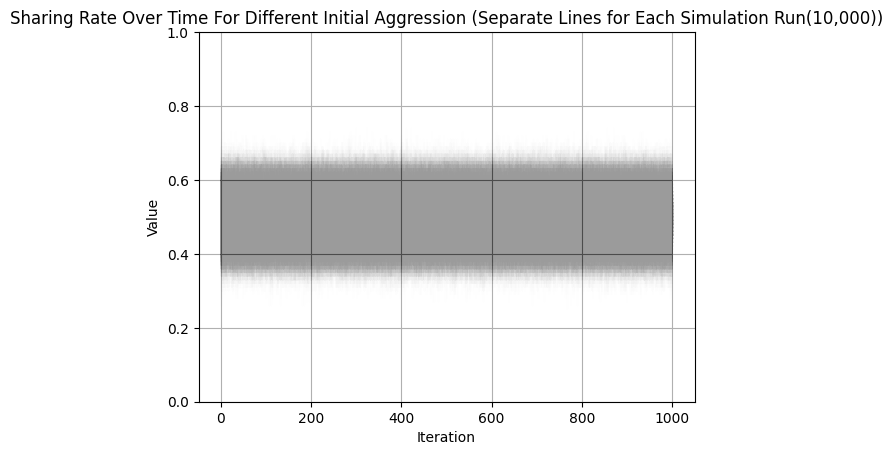

In [ ]:
# prompt: plot sharing rate and corporate aggression from df_large with a separate line for each outer iteration. Use iteration as the x axis

import matplotlib.pyplot as plt

# Assuming df_large is your DataFrame
for population in df_vlarge['iteration'].unique():
  df_subset = df_vlarge[df_vlarge['iteration'] == population]
  plt.plot(df_subset['time'], df_subset['sharing_rate'], label=f'Population {population}', alpha = 0.002,color = 'black')
  #plt.plot(df_subset['iteration'], df_subset['corporate_aggression_prob'], label=f'Corporate Aggression (Outer Iteration {outer_iteration})', alpha=0.1)


plt.xlabel('Iteration')
plt.ylabel('Value')
plt.title('Sharing Rate Over Time For Different Initial Aggression (Separate Lines for Each Simulation Run(10,000))')
plt.grid(True)
plt.ylim(0, 1)
plt.show()


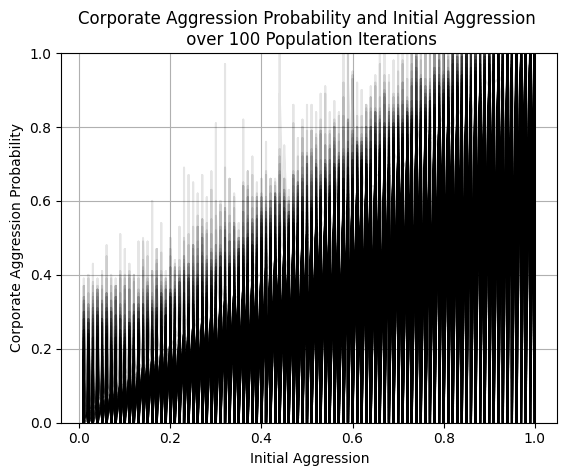

In [ ]:
# prompt: plot sharing rate and corporate aggression from df_large with a separate line for each outer iteration. Use iteration as the x axis

import matplotlib.pyplot as plt

# Assuming df_large is your DataFrame
for population in df_vlarge['iteration'].unique():
  df_subset = df_vlarge[df_vlarge['iteration'] == population]
  #plt.plot(df_subset['iteration'], df_subset['sharing_rate'], label=f'Outer Iteration {outer_iteration}', alpha = 0.1)
  plt.plot(df_subset['init_aggression'],df_subset['corporate_aggression_prob'], label=f'Corporate Aggression in Population {population})', alpha=0.1, color = 'black')


plt.ylabel('Corporate Aggression Probability')
plt.xlabel('Initial Aggression')
plt.title('Corporate Aggression Probability and Initial Aggression \n over 100 Population Iterations')
plt.grid(True)
plt.ylim(0, 1)
plt.show()


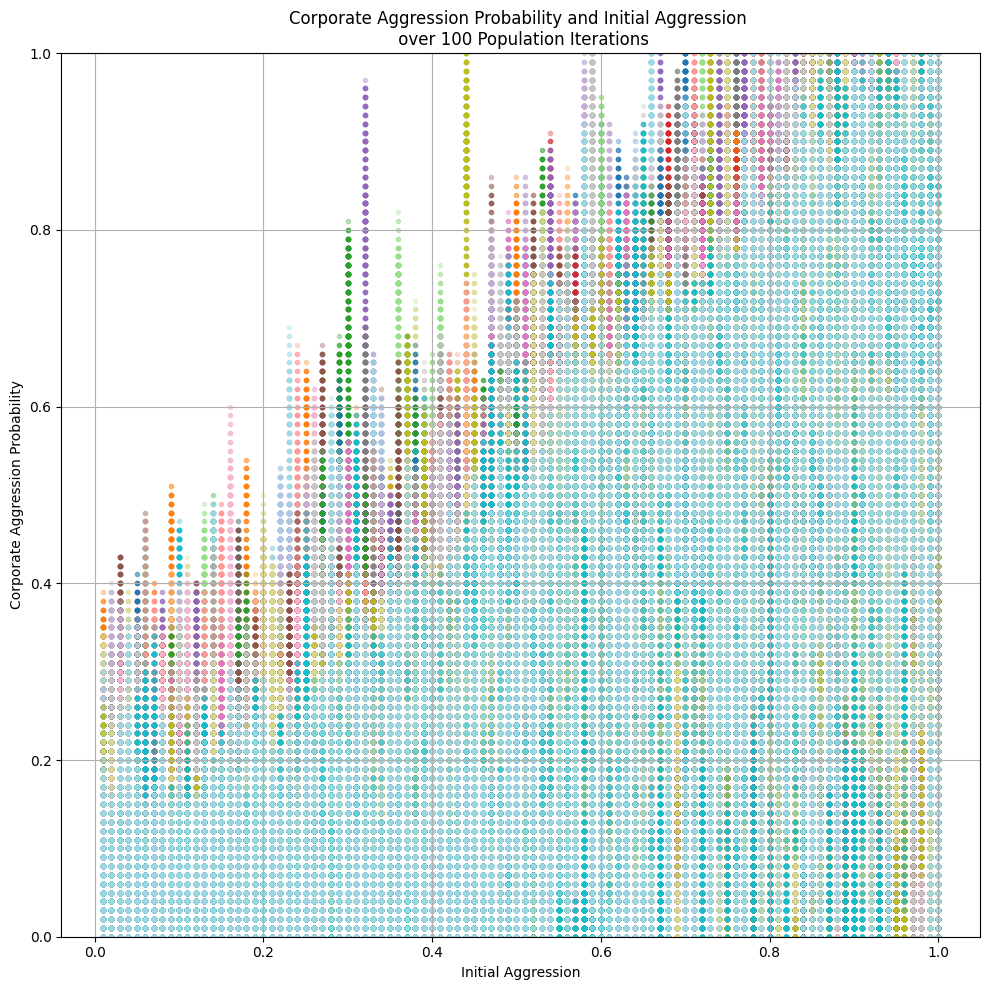

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df_vlarge is your DataFrame
# Use Seaborn color palette to get unique colors for each population
colors = sns.color_palette("tab20", n_colors=len(df_vlarge['iteration'].unique()))  # "tab20" is a set of distinct colors

# Create the plot
plt.figure(figsize=(10, 10))

# Loop through each population and plot sharing rate and corporate aggression probability
for idx, population in enumerate(df_vlarge['iteration'].unique()):
    df_subset = df_vlarge[df_vlarge['iteration'] == population]

    # Plot corporate aggression probability with a unique color for each population
    plt.scatter(df_subset['init_aggression'], df_subset['corporate_aggression_prob'],
             label=f'Population {population}', alpha=0.3, color=colors[idx], marker='.')

# Set labels and title for the plot
plt.ylabel('Corporate Aggression Probability')
plt.xlabel('Initial Aggression')
plt.title('Corporate Aggression Probability and Initial Aggression \n over 100 Population Iterations')
plt.grid(True)
plt.ylim(0, 1)

# Show the plot
plt.tight_layout()
plt.show()


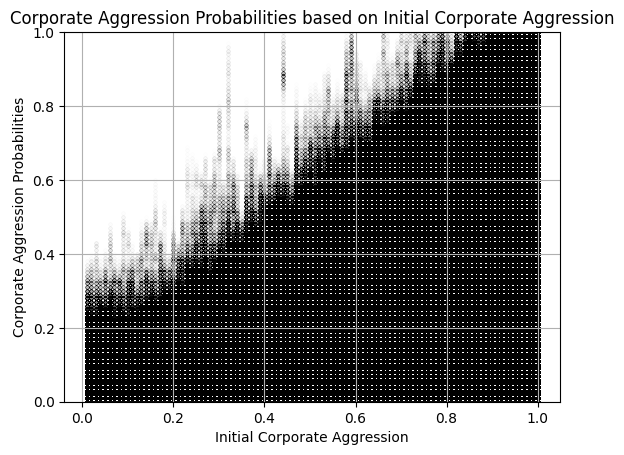

In [ ]:
# prompt: plot sharing rate and corporate aggression from df_large with a separate line for each outer iteration. Use iteration as the x axis

import matplotlib.pyplot as plt

# Assuming df_large is your DataFrame
for init_aggression in df_vlarge['init_aggression'].unique():
  df_subset = df_vlarge[df_vlarge['init_aggression'] == init_aggression]
  plt.scatter(df_subset['init_aggression'],df_subset['corporate_aggression_prob'], label=f'Corporate Aggression (Outer Iteration {init_aggression})', alpha=0.005, color = 'black', marker = '.')


plt.ylabel('Corporate Aggression Probabilities')
plt.xlabel('Initial Corporate Aggression')
plt.title('Corporate Aggression Probabilities based on Initial Corporate Aggression')
plt.grid(True)
plt.ylim(0, 1)
plt.show()


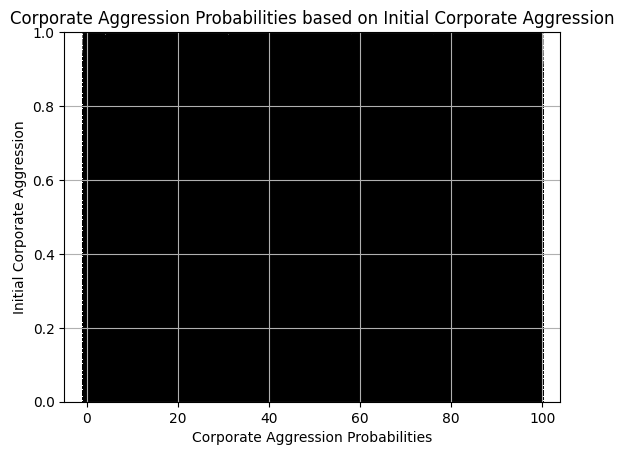

In [ ]:
# prompt: plot sharing rate and corporate aggression from df_large with a separate line for each outer iteration. Use iteration as the x axis

import matplotlib.pyplot as plt

# Assuming df_large is your DataFrame
for init_aggression in df_vlarge['init_aggression'].unique():
  df_subset = df_vlarge[df_vlarge['init_aggression'] == init_aggression]
  plt.scatter(df_subset['iteration'],df_subset['corporate_aggression_prob'], label=f'Corporate Aggression (Outer Iteration {init_aggression})', alpha=0.01, color = 'black')


plt.xlabel('Corporate Aggression Probabilities')
plt.ylabel('Initial Corporate Aggression')
plt.title('Corporate Aggression Probabilities based on Initial Corporate Aggression')
plt.grid(True)
plt.ylim(0, 1)
plt.show()


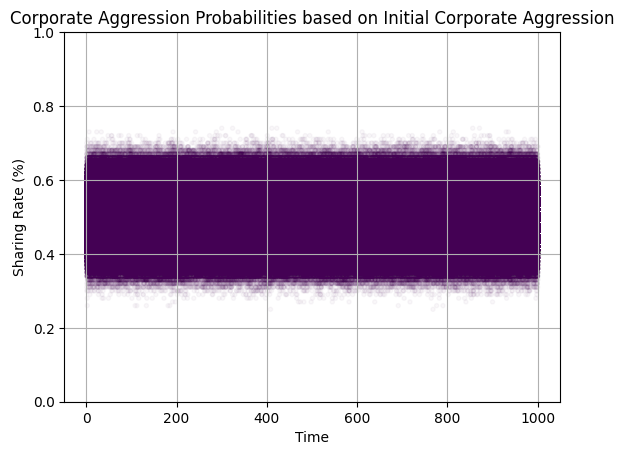

In [ ]:
# prompt: plot sharing rate and corporate aggression from df_large with a separate line for each outer iteration. Use iteration as the x axis

import matplotlib.pyplot as plt

# Assuming df_large is your DataFrame
for init_aggression in df_vlarge['init_aggression'].unique():
  df_subset = df_vlarge[df_vlarge['init_aggression'] == init_aggression]
  plt.scatter(df_subset['time'],df_subset['sharing_rate'], label=f'Corporate Aggression (Outer Iteration {init_aggression})',c = df_subset['init_aggression'], cmap='viridis', alpha=0.03, marker = '.')


plt.xlabel('Time')
plt.ylabel('Sharing Rate (%)')
plt.title('Sharing Rate over Time for all Initial Corporate Aggression Levels')
plt.grid(True)
plt.ylim(0, 1)
plt.show()


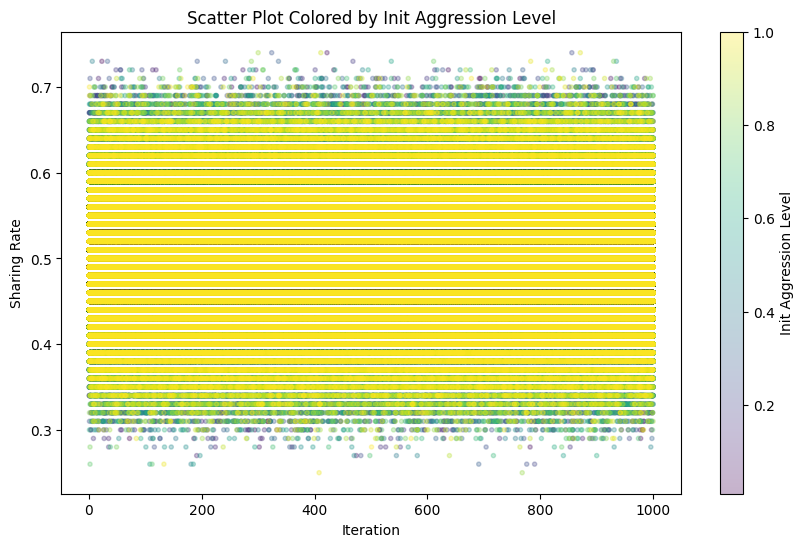

In [ ]:
import matplotlib.pyplot as plt

# Create the scatter plot, coloring by 'init_aggression' from the entire DataFrame
plt.figure(figsize=(10, 6))
scatter = plt.scatter(df_vlarge['time'], df_vlarge['sharing_rate'],
                      c=df_vlarge['init_aggression'],  # Color by init_aggression
                      cmap='viridis',  # Choose your desired colormap
                      alpha=0.3,
                      marker='.')

# Add a colorbar to show the mapping from init_aggression values to colors
plt.colorbar(scatter, label='Init Aggression Level')

# Add labels and title
plt.xlabel('Time')
plt.ylabel('Sharing Rate')
plt.title('Sharing Rate Over Time Colored by Init Aggression Level')
plt.ylim(0, 1)
# Show the plot
plt.show()

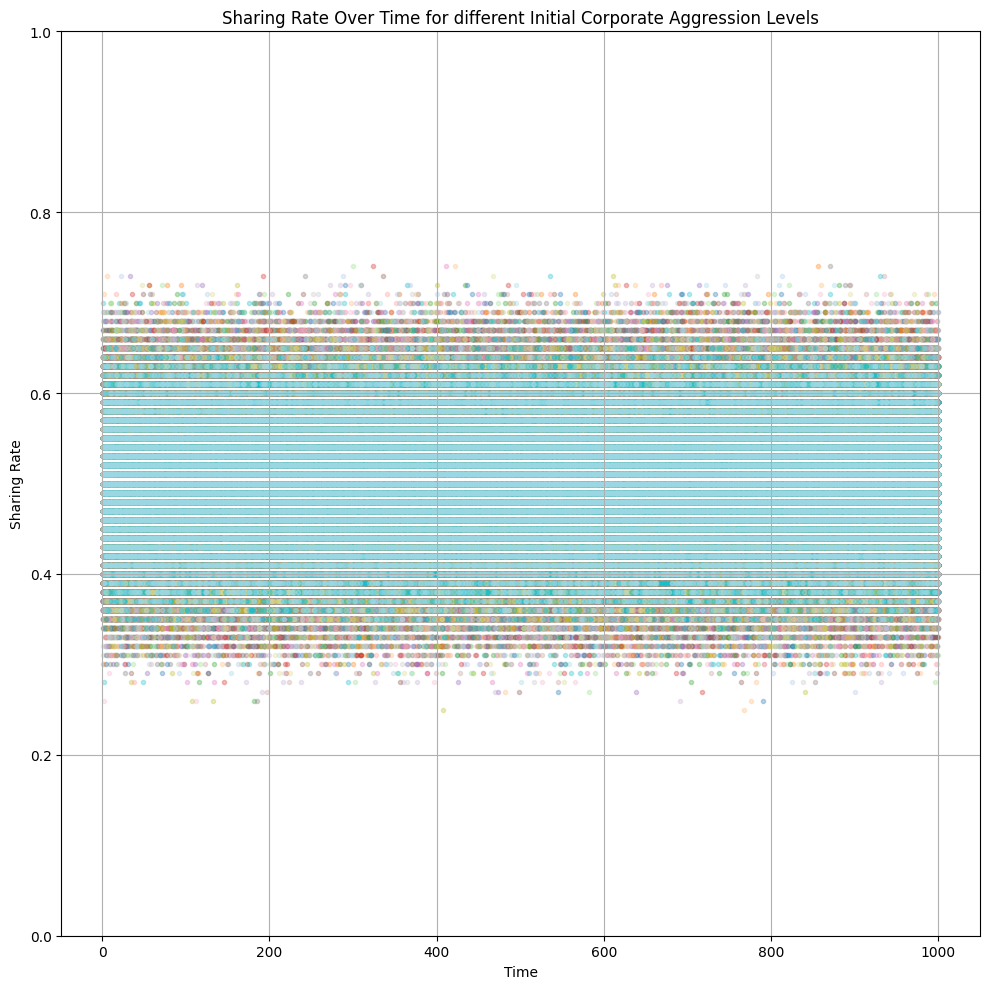

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df_vlarge is your DataFrame
# Use Seaborn color palette to get unique colors for each population
colors = sns.color_palette("tab20", n_colors=len(df_vlarge['init_aggression'].unique()))  # "tab20" is a set of distinct colors

# Create the plot
plt.figure(figsize=(10, 10))

# Loop through each population and plot sharing rate and corporate aggression probability
for idx, init_aggr in enumerate(df_vlarge['init_aggression'].unique()):
    df_subset = df_vlarge[df_vlarge['init_aggression'] == init_aggr]

    # Plot corporate aggression probability with a unique color for each population
    plt.scatter(df_subset['time'], df_subset['sharing_rate'],
             label=f'Initial Aggression Level {init_aggr}', alpha=0.3, color=colors[idx], marker='.')

# Set labels and title for the plot
plt.ylabel('Sharing Rate')
plt.xlabel('Time')
plt.title('Sharing Rate Over Time for different Initial Corporate Aggression Levels')
plt.grid(True)
plt.ylim(0, 1)

# Show the plot
plt.tight_layout()
plt.show()


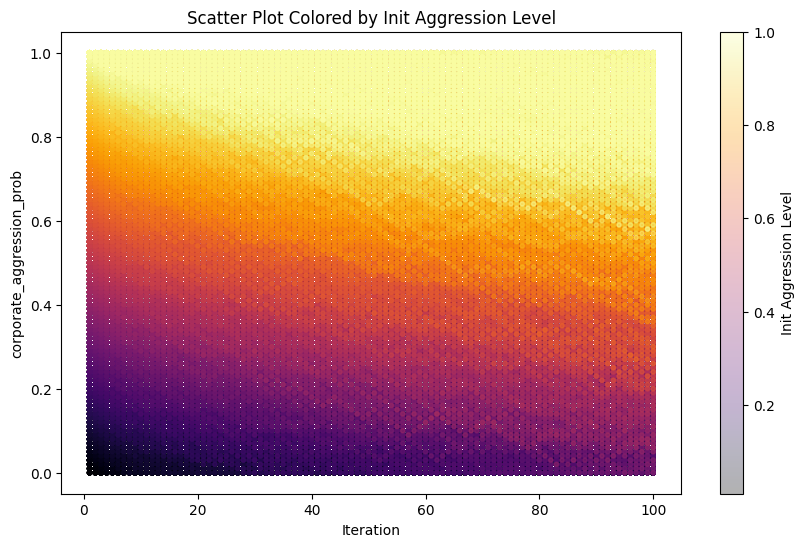

In [ ]:
import matplotlib.pyplot as plt

# Create the scatter plot, coloring by 'init_aggression' from the entire DataFrame
plt.figure(figsize=(10, 6))
scatter = plt.scatter(df_vlarge['iteration'], df_vlarge['corporate_aggression_prob'],
                      c=df_vlarge['init_aggression'],  # Color by init_aggression
                      cmap='inferno',  # Choose your desired colormap
                      alpha=0.3,
                      marker='.')

# Add a colorbar to show the mapping from init_aggression values to colors
plt.colorbar(scatter, label='Init Aggression Level')

# Add labels and title
plt.xlabel('Iteration')
plt.ylabel('corporate_aggression_prob')
plt.title('Scatter Plot Colored by Init Aggression Level')

# Show the plot
plt.show()

In [ ]:
#correlations_df.to_csv("mar25_100ind2000runs.csv")

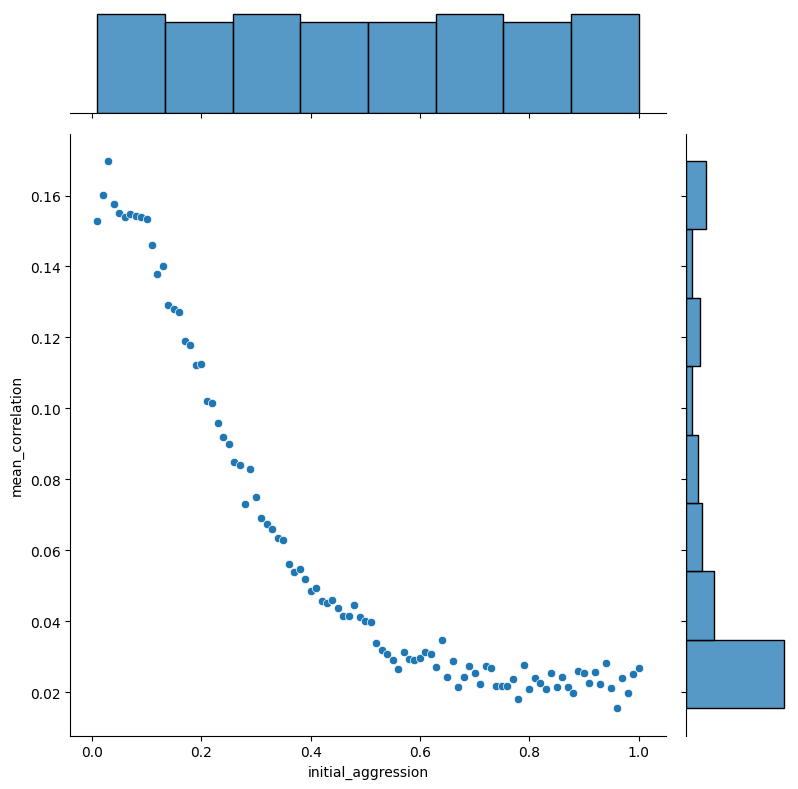

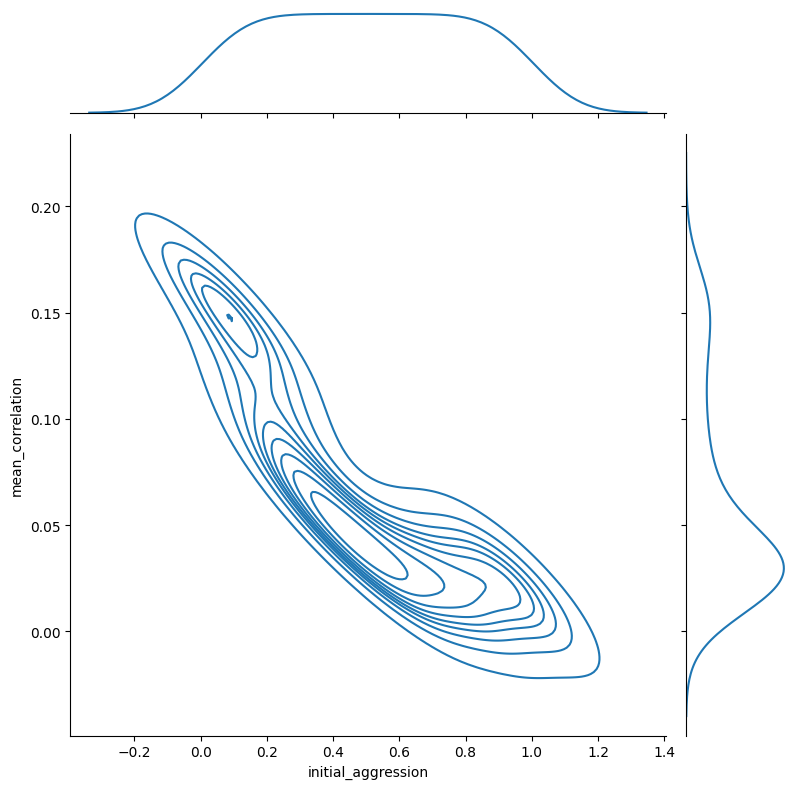

In [ ]:
# prompt: seaborn plot all values scatter and edge histogram in correlations_df, place confidence interval around each mean point

import seaborn as sns

# Assuming correlations_df is your DataFrame with 'initial_aggression' and 'mean_correlation'
sns.jointplot(data=correlations_df, x='initial_aggression', y='mean_correlation', kind="scatter", height=8)
plt.show()


# Alternatively, you can use a scatter plot with marginal histograms using jointplot
sns.jointplot(data=correlations_df, x='initial_aggression', y='mean_correlation', kind="kde", height=8)
plt.show()

# Customize the plot further using seaborn's options
# For example, you can add a title and change the colors

# sns.jointplot(data=correlations_df, x='initial_aggression', y='mean_correlation', kind="kde", height=8).fig.suptitle("Correlation vs. Initial Corporate Aggression")
# plt.show()


# Part Three: Learning Rate
## Simulation after adding a Learning Rate


## function - privacy simulation 2

In [ ]:
import numpy as np
import random
from typing import List, Dict
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

class PrivacySimulation_2:
    def __init__(self,
                 num_individuals: int = 100, #N
                 initial_corporate_aggression: float = 0.5, #S_a,0
                 initial_norm: float = 0.5, #R_i,0
                 norm_learning_rate: float = 0.1, #beta, LR
                 corporate_step_boldness: float = 0.01, #B
                 dr_pause: int = 10, #D_r
                 initial_sharing_prob: float = 0.5, #P_i,0
                 platform_tenure: int = 10, #T_p
                 corporate_aggression_sensitivity: float = 0.1, #phi, CAS
                 social_influence_strength: float = 0.2): #alpha, SI
        """
        Initialize the privacy exploitation simulation with norm dynamics

        Args:
            N num_individuals (int): Number of individual agents
            S_a,0 initial_corporate_aggression (float): Initial probability of corporate aggressive strategy
            R_i,0 initial_norm (float): initial individual probability of sharing (coin toss)
            LR, Beta norm_learning_rate (float): Rate at which agents update their behavior based on observed norms
            B corporate_step_boldness (float): The percentage increase/decrease in corporate boldness after observing sharing rate at time t
            D_r dr_pause (int): pause after deciding not to post for naturalness. set to -1 to ignore
            P_i,0 initial_sharing_prob (float): Initial probability of sharing information (coin toss)
            T_p platform_tenure (int): the length of time before/after the pause is applied
            CAS, Phi corporate_aggression_sensitivity (float): Sensitivity of individuals to corporate aggression, multiplies sharing rate an adds/reduces from live sharing decisions
            SI, alpha social_influence_strength (float): Strength of social influence on individual decisions

        """
        # Simulation parameters
        self.num_individuals = num_individuals
        self.corporate_aggression_prob = initial_corporate_aggression
        self.corporate_step_boldness = corporate_step_boldness
        self.initial_sharing_prob = initial_sharing_prob
        self.initial_corporate_aggression = initial_corporate_aggression
        self.norm_learning_rate = norm_learning_rate
        self.social_influence_strength = social_influence_strength
        self.corporate_aggression_sensitivity = corporate_aggression_sensitivity
        self.R_s = initial_norm #initialized with R_i,0 then calculated subsequently
        self.dr_pause = dr_pause
        self.platform_tenure = platform_tenure

        # Track simulation state
        self.current_iteration = 0
        self.corporate_decision = None
        self.individual_sharing_history = []
        self.corporate_strategy_history = [] #text
        self.corporate_decision_history = [] #boolean
        self.decision_history = []
        self.pop_norm_history = [] #list of R_s calculated
        self.live_adjusted_sharing_probs = []


        # Initialize agents and pass simulation arguments to each to begin.
        self.individual_agents = [
            IndividualAgent_2(
                norm_learning_rate=self.norm_learning_rate,
                social_influence_strength=self.social_influence_strength,
                corporate_aggression_sensitivity=self.corporate_aggression_sensitivity,
                dr_pause=self.dr_pause,
                initial_sharing_prob=self.initial_sharing_prob,
                platform_tenure = self.platform_tenure
            ) for _ in range(num_individuals)
        ]
        self.corporate_agent = CorporateAgent_2()

    def run_iteration(self):
        """
        Run a single iteration of the simulation with norm dynamics
        """

        # Individual sharing decisions
        agent_response_full = [ #index is separate individuals
            agent.decide_to_share(social_norm = self.R_s) for agent in self.individual_agents
        ]


        agent_response_1, agent_response_2 = zip(*agent_response_full)
        individual_sharing_decisions = list(agent_response_1)
        live_adjusted_sharing_probs = list(agent_response_2)
        live_adjusted_sharing_probs = sum(live_adjusted_sharing_probs) / len(live_adjusted_sharing_probs)

        #if self.current_iteration % 17 == 0:
            #print("Sharing norm: ", self.R_s)
            #print(agent_response_2)


        # Calculate sharing rate
        self.R_s = sum(individual_sharing_decisions) / self.num_individuals


        # Update individual agents' norms based on aggregate behavior
        for agent in self.individual_agents:
            agent.update_sharing_norm(self.R_s)

        # Corporate strategy selection
        corporate_strategy = self.corporate_agent.choose_strategy(
            self.corporate_aggression_prob
        )
        if corporate_strategy == 'aggressive':
            self.corporate_decision = 1
        else:
            self.corporate_decision = 0

        # Update corporate aggression probability based on sharing rate. Try with fixed 0.5 or with comparison with aggression
        #if self.R_s > 2 * self.corporate_aggression_prob:
        if self.R_s > 0.5:
            # If majority share, increase likelihood of aggressive strategy
            #self.corporate_decision = 1
            self.corporate_aggression_prob = min(
                1.0,
                self.corporate_aggression_prob + self.corporate_step_boldness
            )
        else:
            # If majority resist, decrease likelihood of aggressive strategy
            #self.corporate_decision = 0
            self.corporate_aggression_prob = max(
                0.0,
                self.corporate_aggression_prob - self.corporate_step_boldness
            )
        # Collect personal sharing history for all agents
        personal_sharing_histories = [
            agent.get_personal_sharing_history() for agent in self.individual_agents
        ]
        updated_individual_norms = [agent.personal_sharing_norm for agent in self.individual_agents]

        # Flatten the structure for easier access
        #flattened_personal_sharing_histories = [
        #    sharing_history for agent_history in personal_sharing_histories for sharing_history in agent_history
        #]

        #self.decision_history.append(flattened_personal_sharing_histories)

        # Record history
        self.individual_sharing_history.append(individual_sharing_decisions)
        self.live_adjusted_sharing_probs.append(live_adjusted_sharing_probs)
        self.corporate_strategy_history.append(corporate_strategy)
        self.corporate_decision_history.append(self.corporate_decision)
        self.pop_norm_history.append(self.R_s)
        #self.decision_history.append(self.corporate_decision)

        # Increment iteration
        self.current_iteration += 1

        return {
            'time': self.current_iteration,
            'sharing_rate': self.R_s,
            'corporate_strategy': corporate_strategy,
            'corporate_aggression_prob': self.corporate_aggression_prob,
            #'sharing_norm': R_s,
            'corporate_decision_history': self.corporate_decision,
            'corporate_step_boldness': self.corporate_step_boldness,
            'norm_learning_rate': self.norm_learning_rate,
            'social_influence_strength': self.social_influence_strength,
            'individual_sharing_histories': self.individual_sharing_history,  # Add individual histories
            'updated_individual_norms': updated_individual_norms,
            'corporate_aggression_sensitivity': self.corporate_aggression_sensitivity,
            'live_adjusted_sharing_probs': self.live_adjusted_sharing_probs
        }

    def reset_simulation(self):
        """Reset all necessary attributes to initial conditions for each population."""
        self.sharing_prob = self.initial_sharing_prob  # Reset sharing probability
        # Add other parameters that should reset for each population
        self.corporate_aggression_prob = 0.5
        self.personal_sharing_history = []
        self.corporate_strategy_history = []
        self.corporate_decision_history = []
        self.decision_history = []
        self.pop_norm_history = []
        self.live_adjusted_sharing_probs = []
        self.R_s = 0.5

    def run_simulation(self, time: int = 100):
        """
        Run the full simulation for specified number of populations
        """
        results = []
        for _ in range(time):
            iteration_result = self.run_iteration()
            results.append(iteration_result)

        self.reset_simulation()  # Ensure parameters reset
        return results



In [ ]:
class IndividualAgent_2:
    def __init__(self,
                 initial_sharing_prob: float = 0.50, #P_i(t,0) updates to P_i(t)
                 corporate_aggression_sensitivity: float = 0.1, #phi
                 norm_learning_rate: float = 0.1, #beta,
                 platform_tenure: int = 10, #t_p
                 dr_pause: int = 10, #pause after not posting for naturalness
                 social_influence_strength: float = 0.2): #alpha
        """
        Initialize an individual agent with norm-based decision-making

        Args:
            initial_sharing_prob (float): Initial probability of sharing information
            risk_tolerance (float): Agent's tolerance for privacy risk
            norm_learning_rate (float): Rate of updating personal norm based on social norm
            social_influence_strength (float): Strength of social norm influence
        """
        # Individual characteristics
        self.sharing_prob = initial_sharing_prob #live decision starts at P_i(t,0)
        self.corporate_aggression_sensitivity = corporate_aggression_sensitivity
        self.live_decision_sharing_prob = None
        # Norm-related attributes
        self.personal_sharing_norm = initial_sharing_prob #R'_s (t), the first time this runs, we use an inherent probability
        self.norm_learning_rate = norm_learning_rate
        self.social_influence_strength = social_influence_strength

        # Personal sharing history
        self.personal_sharing_history = []  # Track individual decisions. Index is Time
        self.dr_pause = dr_pause #pause after not posting
        self.initial_pause = dr_pause
        self.platform_tenure = platform_tenure

    def decide_to_share(self, social_norm) -> bool:
        """
        Stochastic decision to share information, influenced by personal and social norms

        Returns:
            bool: Whether agent decides to share information
        """
        #print(self.personal_sharing_history)
        try:
          if self.dr_pause > 0 & self.personal_sharing_history[-1] == False & len(self.personal_sharing_history) < self.platform_tenure:
            self.dr_pause -= 1
            #print("didnt share last go... pausing", self.dr_pause)
            self.sharing_prob = 0
            if self.dr_pause < 0:
                decay_factor = 0.8
                #print("restarting pause")
                #print(self.personal_sharing_history)
                historical_level = sum(self.personal_sharing_history)/len(self.personal_sharing_history)
                self.personal_sharing_norm = (self.personal_sharing_norm * decay_factor) + (historical_level * (1 - decay_factor))
                self.sharing_prob = historical_level
                self.dr_pause = self.initial_pause
        except IndexError:
            pass
        #print("CONTINUE...")
        # Combine personal probability with norm influence for LIVE decision making
        self.live_decision_sharing_prob = (
            self.sharing_prob * (1 - self.social_influence_strength) +
            self.personal_sharing_norm * self.social_influence_strength
            * (1 - (social_norm * self.corporate_aggression_sensitivity))
        )
        #print("live decision: ",self.live_decision_sharing_prob)
        self.sharing_prob = self.live_decision_sharing_prob

        # Make a decision based on the adjusted probability
        decision = random.random() < self.live_decision_sharing_prob

        #include pause after not posting

        # Record the decision in the personal sharing history
        self.personal_sharing_history.append(decision)

        return [decision, self.live_decision_sharing_prob]

    def update_sharing_norm(self, current_social_norm: float):
        """
        Update personal sharing norm based on observed social norm

        Args:
            current_social_norm (float): Aggregate sharing rate in the population
        """
        # Gradually adjust personal norm towards social norm
        #self.personal_sharing_norm += self.norm_learning_rate * (
        #    current_social_norm - self.personal_sharing_norm
        #)

        self.personal_sharing_norm = ((current_social_norm - self.live_decision_sharing_prob) * self.norm_learning_rate) + self.personal_sharing_norm

        #print(self.personal_sharing_norm)

        # Optional: Update individual sharing probability as well
        #self.sharing_prob = (
        #    self.sharing_prob * (1 - self.norm_learning_rate) +
        #    self.personal_sharing_norm * self.norm_learning_rate
        #)

    def get_personal_sharing_history(self):
            """
            Return the individual agent's sharing history
            """
            return self.personal_sharing_history

class CorporateAgent_2:
    def choose_strategy(self, aggression_prob: float) -> str:
        """
        Select corporate strategy based on aggression probability

        Args:
            aggression_prob (float): Probability of choosing aggressive strategy

        Returns:
            str: Selected strategy ('aggressive' or 'fair')
        """
        return 'aggressive' if random.random() < aggression_prob else 'fair'



### Simulation Two Run. 1000 people, 2000 iteration - decision making is influenced by social norms at a given learning rate (speed of conforming to norms)

In [ ]:
# Example usage comment for Jupyter Notebook
simulation = PrivacySimulation_2(
     num_individuals=100,
     initial_corporate_aggression=0.3,
     norm_learning_rate=0.3,  # How quickly agents adapt to social norms
     social_influence_strength=0.4,  # How much social norms impact individual decisions
     corporate_aggression_sensitivity = 2 #phi
     )
results2 = simulation.run_simulation(time=100)

In [ ]:
# prompt: read results into a pandas dataframe

# Assuming the code you provided is in a Jupyter Notebook cell and you've run it
# to generate the 'data' DataFrame.

import pandas as pd
pd.set_option('display.float_format', lambda x: '%.2f' % x)

# Create a DataFrame from the results of the simulation
results2_df = pd.DataFrame(results2)

results2_df['avg_personal_norm'] = results2_df['updated_individual_norms'].apply(lambda x: np.mean(x) if isinstance(x, list) else np.nan)
results2_df['avg_live_sharing'] = results2_df['live_adjusted_sharing_probs'].apply(lambda x: np.mean(x) if isinstance(x, list) else np.nan)

#results2_df['avg_personal_norm'] = results2_df['individual_sharing_histories'].apply(lambda x: np.mean(x[0]) if isinstance(x, list) and len(x) > 0 else np.nan)

# Print the first few rows of the DataFrame to see the results
print(results2_df.head().round(2))

# You can now perform various analyses on this DataFrame
# for example:
# results_df.describe() # Descriptive statistics
# results_df.plot(x='iteration', y='sharing_rate') # Plot the sharing rate over time



   time  sharing_rate corporate_strategy  corporate_aggression_prob  \
0     1          0.14               fair                       0.29   
1     2          0.09               fair                       0.28   
2     3          0.11               fair                       0.27   
3     4          0.20               fair                       0.26   
4     5          0.11               fair                       0.25   

   corporate_decision_history  corporate_step_boldness  norm_learning_rate  \
0                           0                     0.01                0.30   
1                           0                     0.01                0.30   
2                           0                     0.01                0.30   
3                           0                     0.01                0.30   
4                           0                     0.01                0.30   

   social_influence_strength  \
0                       0.40   
1                       0.40   
2       

In [ ]:
results2_df['live_adjusted_sharing_probs']

,live_adjusted_sharing_probs
0,"[0.15000000000000024, 0.13233600000000031, 0.1..."
1,"[0.15000000000000024, 0.13233600000000031, 0.1..."
2,"[0.15000000000000024, 0.13233600000000031, 0.1..."
3,"[0.15000000000000024, 0.13233600000000031, 0.1..."
4,"[0.15000000000000024, 0.13233600000000031, 0.1..."
...,...
95,"[0.15000000000000024, 0.13233600000000031, 0.1..."
96,"[0.15000000000000024, 0.13233600000000031, 0.1..."
97,"[0.15000000000000024, 0.13233600000000031, 0.1..."
98,"[0.15000000000000024, 0.13233600000000031, 0.1..."


In [ ]:
import pandas as pd

# Unpack nested lists
results2_df_unpacked = pd.DataFrame(
    results2_df['live_adjusted_sharing_probs'].apply(lambda x: [float(item) for item in x]).to_list()
)

# Rename columns if needed
results2_df_unpacked.columns = [f'time_{i}' for i in range(results2_df_unpacked.shape[1])]

# Display the new DataFrame
print(results2_df_unpacked.head())


   time_0  time_1  time_2  time_3  time_4  time_5  time_6  time_7  time_8  \
0    0.15    0.13    0.12    0.11    0.10    0.09    0.08    0.08    0.07   
1    0.15    0.13    0.12    0.11    0.10    0.09    0.08    0.08    0.07   
2    0.15    0.13    0.12    0.11    0.10    0.09    0.08    0.08    0.07   
3    0.15    0.13    0.12    0.11    0.10    0.09    0.08    0.08    0.07   
4    0.15    0.13    0.12    0.11    0.10    0.09    0.08    0.08    0.07   

   time_9  ...  time_90  time_91  time_92  time_93  time_94  time_95  time_96  \
0    0.07  ...     0.01     0.01     0.01     0.01     0.01     0.01     0.01   
1    0.07  ...     0.01     0.01     0.01     0.01     0.01     0.01     0.01   
2    0.07  ...     0.01     0.01     0.01     0.01     0.01     0.01     0.01   
3    0.07  ...     0.01     0.01     0.01     0.01     0.01     0.01     0.01   
4    0.07  ...     0.01     0.01     0.01     0.01     0.01     0.01     0.01   

   time_97  time_98  time_99  
0     0.01     0.01

In [ ]:
results2_df['individual_sharing_histories'].shape

(100,)

In [ ]:
len(results2_df['individual_sharing_histories'][0])

100

In [ ]:
len(results2_df['individual_sharing_histories'][0][0])

100

In [ ]:
# prompt: correlation between numerical variables in result_df

# Assuming results_df is your DataFrame from the simulation
correlation_matrix2 = results2_df.drop(columns = ['corporate_strategy','individual_sharing_histories','updated_individual_norms','live_adjusted_sharing_probs']).corr()

# Display the correlation matrix
print(correlation_matrix2)

# You can also focus on specific correlations
print(f"Correlation between sharing_rate and corporate_aggression_prob: {results2_df['sharing_rate'].corr(results2_df['corporate_aggression_prob'])}")


                                  time  sharing_rate  \
time                              1.00         -0.75   
sharing_rate                     -0.75          1.00   
corporate_aggression_prob        -0.76          0.82   
corporate_decision_history       -0.25          0.12   
corporate_step_boldness            NaN           NaN   
norm_learning_rate                 NaN           NaN   
social_influence_strength          NaN           NaN   
corporate_aggression_sensitivity   NaN           NaN   
avg_personal_norm                -0.83          0.93   
avg_live_sharing                   NaN           NaN   

                                  corporate_aggression_prob  \
time                                                  -0.76   
sharing_rate                                           0.82   
corporate_aggression_prob                              1.00   
corporate_decision_history                             0.35   
corporate_step_boldness                                 NaN   
norm_

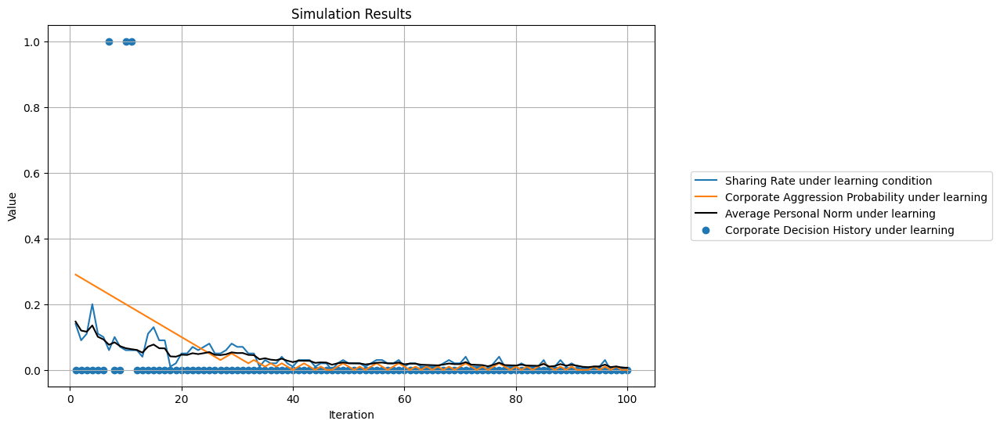

In [ ]:
# prompt: plot results
import matplotlib.pyplot as plt
# Assuming 'results' is a list of dictionaries as returned by the simulation
# Extract sharing rate and corporate aggression probability for plotting


# Create the plot
plt.figure(figsize=(10, 6))
plt.plot(results2_df['time'],results2_df['sharing_rate'], label='Sharing Rate under learning condition')
plt.plot(results2_df['time'],results2_df['corporate_aggression_prob'], label='Corporate Aggression Probability under learning')
plt.plot(results2_df['time'],results2_df['avg_personal_norm'], label='Average Personal Norm under learning', color = 'black')
plt.scatter(results2_df['time'],results2_df['corporate_decision_history'], label='Corporate Decision History under learning')
plt.xlabel('Iteration')
plt.ylabel('Value')
plt.title('Simulation Results')
plt.legend(bbox_to_anchor=(1.05, 0.5), loc='center left')
plt.grid(True)
plt.show()


## Effect of the Pause

In [ ]:
# Example usage in Jupyter Notebook
step_3a_results = []
for dr_pause in [0,1,3,7,14,30]:
  for iteration in range(100):
    simulation = PrivacySimulation_2(num_individuals=100,
                                     initial_corporate_aggression=0.15,
                                     dr_pause=dr_pause,
                                     platform_tenure = 10)
    results = simulation.run_simulation(time=100)
    for result in results:
      result['iteration'] = iteration
      result['dr_pause'] = dr_pause
    step_3a_results.append(results)

#step_1b_results_df = pd.DataFrame(step_1b_results)


# Example usage
# Assuming `large_results_np` is a list of lists with dictionaries
step_3a_results_df = convert_to_dataframe(step_3a_results)



In [ ]:
# prompt: add a lag column to results_df - the average of the previous five corporate agression prob and plot the new lagged value as a separate line

import pandas as pd

# Assuming 'iteration' is a column and your DataFrame has it
# Apply the rolling mean calculation per iteration group, and ensure index alignment

# First, ensure that the 'iteration' column is part of the index
# If iteration is not an index, you can group by it directly.

# Compute rolling mean per iteration using transform instead of apply
# Ensure rolling calculations reset per iteration
step_3a_results_df['lagged_corporate_aggression_prob'] = (
    step_3a_results_df.groupby('iteration')['corporate_aggression_prob']
    .apply(lambda x: x.rolling(window=100, min_periods=1).mean())
    .reset_index(level=0, drop=True)  # Keep index aligned
)

step_3a_results_df['lagged_corporate_decision'] = (
    step_3a_results_df.groupby('iteration')['corporate_decision_history']
    .apply(lambda x: x.rolling(window=100, min_periods=1).mean())
    .reset_index(level=0, drop=True)  # Keep index aligned
)

# Verify the results
print(step_3a_results_df.head())


   time  sharing_rate corporate_strategy  corporate_aggression_prob  \
0     1          0.51               fair                       0.16   
1     2          0.41               fair                       0.17   
2     3          0.40               fair                       0.18   
3     4          0.48               fair                       0.19   
4     5          0.41               fair                       0.20   

   corporate_decision_history  corporate_step_boldness  norm_learning_rate  \
0                           0                     0.01                 0.1   
1                           0                     0.01                 0.1   
2                           0                     0.01                 0.1   
3                           0                     0.01                 0.1   
4                           0                     0.01                 0.1   

   social_influence_strength  \
0                        0.2   
1                        0.2   
2       

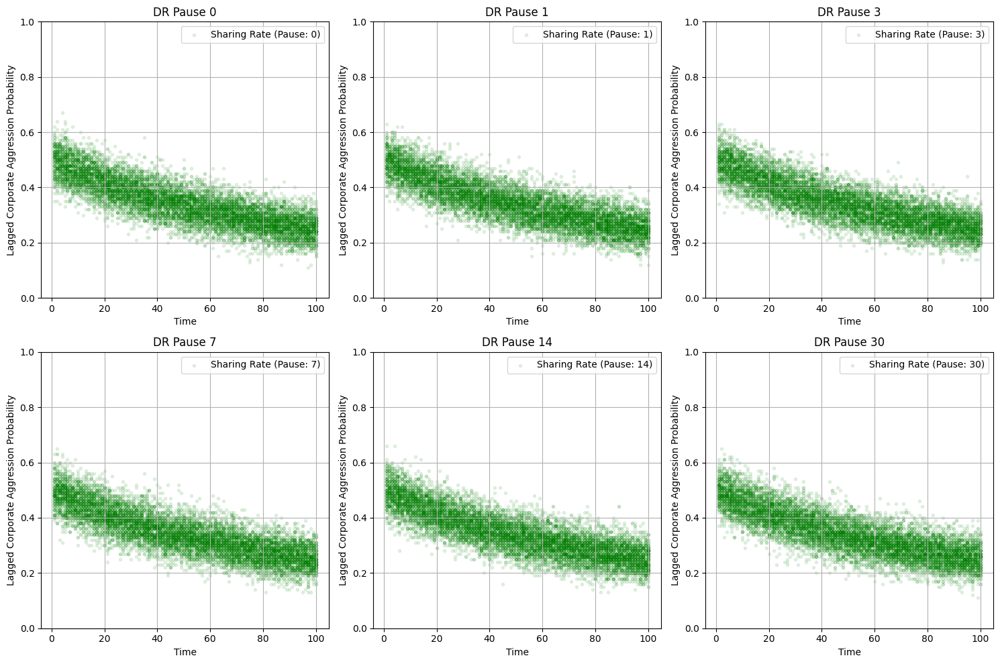

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'corporate_step_boldness' is a column in your DataFrame
unique_dr_pause = step_3a_results_df['dr_pause'].unique()

# Determine the number of rows and columns for the grid layout
n_plots = len(unique_dr_pause)
n_cols = 3  # Number of columns in the grid (adjust as needed)
n_rows = int(np.ceil(n_plots / n_cols))  # Number of rows in the grid

# Create the subplots grid
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))

# Flatten the axes array to easily index it
axes = axes.flatten()

# Create a separate plot for each unique level of corporate_step_boldness
for i, level in enumerate(unique_dr_pause):
    # Filter the data for the current level of corporate_step_boldness
    level_data = step_3a_results_df[step_3a_results_df['dr_pause'] == level]

    # Get the current axis to plot on
    ax = axes[i]

    # Scatter plot and line plot
    #ax.plot(level_data['time'], level_data['lagged_corporate_decision'],
     #          label='Lagged Corporate Decision (1 = Aggressive Use)', color='red', alpha=0.3, marker = '.')
#    ax.scatter(level_data['time'], level_data['lagged_corporate_aggression_prob'],
#               label=f'Lagged Corporate Aggression Probability (Pause: {level})',
#               alpha=0.1, marker='.')
    ax.scatter(level_data['time'], level_data['sharing_rate'],
               label=f'Sharing Rate (Pause: {level})', color = 'green',
               alpha=0.1, marker='.')
    # Add labels and title
    ax.set_xlabel('Time')
    ax.set_ylabel('Lagged Corporate Aggression Probability')
    ax.set_title(f'DR Pause {level}')
    ax.set_ylim(0, 1)
    # Show legend
    ax.legend()

    # Enable grid
    ax.grid(True)

# Remove any empty subplots if there are fewer levels than the total number of subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout to avoid overlapping elements
plt.tight_layout()
plt.show()


## The Effect of Platform Tenure

In [ ]:
# Example usage in Jupyter Notebook
step_3a_results = []
for platform_tenure in [0,1,3,5,10,25,50,75,100]:
  for iteration in range(100):
    simulation = PrivacySimulation_2(num_individuals=100,
                                     initial_corporate_aggression=0.15,
                                     dr_pause=-1,
                                     platform_tenure = platform_tenure)
    results = simulation.run_simulation(time=100)
    for result in results:
      result['iteration'] = iteration
      result['p_tenure'] = platform_tenure
    step_3a_results.append(results)

#step_1b_results_df = pd.DataFrame(step_1b_results)


# Example usage
# Assuming `large_results_np` is a list of lists with dictionaries
step_3a_results_df = convert_to_dataframe(step_3a_results)



In [ ]:
# prompt: add a lag column to results_df - the average of the previous five corporate agression prob and plot the new lagged value as a separate line

import pandas as pd

# Assuming 'iteration' is a column and your DataFrame has it
# Apply the rolling mean calculation per iteration group, and ensure index alignment

# First, ensure that the 'iteration' column is part of the index
# If iteration is not an index, you can group by it directly.

# Compute rolling mean per iteration using transform instead of apply
# Ensure rolling calculations reset per iteration
step_3a_results_df['lagged_corporate_aggression_prob'] = (
    step_3a_results_df.groupby('iteration')['corporate_aggression_prob']
    .apply(lambda x: x.rolling(window=100, min_periods=1).mean())
    .reset_index(level=0, drop=True)  # Keep index aligned
)

step_3a_results_df['lagged_corporate_decision'] = (
    step_3a_results_df.groupby('iteration')['corporate_decision_history']
    .apply(lambda x: x.rolling(window=100, min_periods=1).mean())
    .reset_index(level=0, drop=True)  # Keep index aligned
)

# Verify the results
print(step_3a_results_df.head())


   time  sharing_rate corporate_strategy  corporate_aggression_prob  \
0     1          0.49         aggressive                       0.14   
1     2          0.51               fair                       0.15   
2     3          0.46               fair                       0.14   
3     4          0.48               fair                       0.13   
4     5          0.54               fair                       0.14   

   corporate_decision_history  corporate_step_boldness  norm_learning_rate  \
0                           1                     0.01                 0.1   
1                           0                     0.01                 0.1   
2                           0                     0.01                 0.1   
3                           0                     0.01                 0.1   
4                           0                     0.01                 0.1   

   social_influence_strength  \
0                        0.2   
1                        0.2   
2       

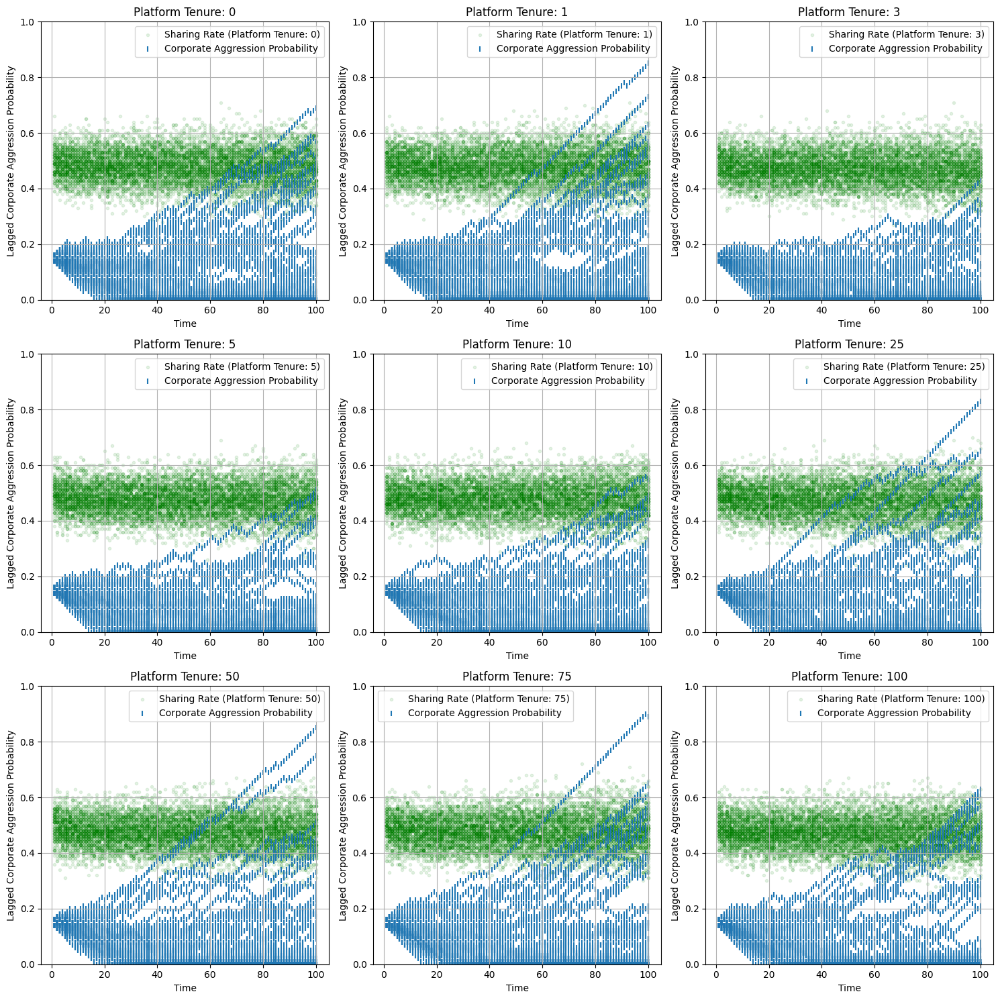

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'corporate_step_boldness' is a column in your DataFrame
unique_dr_pause = step_3a_results_df['p_tenure'].unique()

# Determine the number of rows and columns for the grid layout
n_plots = len(unique_dr_pause)
n_cols = 3  # Number of columns in the grid (adjust as needed)
n_rows = int(np.ceil(n_plots / n_cols))  # Number of rows in the grid

# Create the subplots grid
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))

# Flatten the axes array to easily index it
axes = axes.flatten()

# Create a separate plot for each unique level of corporate_step_boldness
for i, level in enumerate(unique_dr_pause):
    # Filter the data for the current level of corporate_step_boldness
    level_data = step_3a_results_df[step_3a_results_df['p_tenure'] == level]

    # Get the current axis to plot on
    ax = axes[i]

    # Scatter plot and line plot
    #ax.plot(level_data['time'], level_data['lagged_corporate_decision'],
     #          label='Lagged Corporate Decision (1 = Aggressive Use)', color='red', alpha=0.3, marker = '.')
#    ax.scatter(level_data['time'], level_data['lagged_corporate_aggression_prob'],
#               label=f'Lagged Corporate Aggression Probability (Pause: {level})',
#               alpha=0.1, marker='.')
    ax.scatter(level_data['time'], level_data['sharing_rate'],
               label=f'Sharing Rate (Platform Tenure: {level})', color = 'green',
               alpha=0.1, marker='.')
    ax.scatter(level_data['time'],level_data['corporate_aggression_prob'], marker='|', label='Corporate Aggression Probability')
    # Add labels and title
    ax.set_xlabel('Time')
    ax.set_ylabel('Lagged Corporate Aggression Probability')
    ax.set_title(f'Platform Tenure: {level}')
    ax.set_ylim(0, 1)
    # Show legend
    ax.legend()

    # Enable grid
    ax.grid(True)

# Remove any empty subplots if there are fewer levels than the total number of subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout to avoid overlapping elements
plt.tight_layout()
plt.show()

## Scenarios of Learning

## function - Using a scenario comparison function.
Set the number of individuals in Run_Scenario_Comparison function

In [ ]:
def run_scenario_comparison(scenarios, time=20):
    """
    Run and visualize multiple simulation scenarios
    """
    # Set up the plot
    fig, axs = plt.subplots(len(scenarios), 3, figsize=(18, 4*len(scenarios)))
    fig.suptitle('Privacy Simulation: Norm Dynamics Scenarios')

    # Colors for different scenarios
    colors = ['blue', 'green', 'red']

    # Run each scenario
    for i, scenario in enumerate(scenarios):
        # Run simulation
        simulation = PrivacySimulation_2(
            num_individuals=100,
            norm_learning_rate=scenario['learning_rate'],
            social_influence_strength=scenario['influence_strength'],
            #initial_corporate_aggression=scenario['updated_corporate_aggression']
        )
        results = simulation.run_simulation(time=time)

        # Extract data
        sharing_rates = [result['sharing_rate'] for result in results]
        corporate_aggression = [result['corporate_aggression_prob'] for result in results]
        corporate_decisions = [result['corporate_decision_history'] for result in results]
        iterations = range(time)
        avg_personal_norm = [result['updated_individual_norms'][0] for result in results]

        # Scenario label
        scenario_label = f'LR:{scenario["learning_rate"]}, IS:{scenario["influence_strength"]}, CAS:{scenario["corporate_aggression_sensitivity"]}'

        # Sharing Rates Plot
        axs[i, 0].plot(iterations, sharing_rates, color="green", label="sharing rates")
        axs[i, 0].plot(iterations, avg_personal_norm, color="black", label ="average personal norm")
        axs[i, 0].set_title(f'Sharing Rates\n{scenario_label}')
        axs[i, 0].set_xlabel('Time')
        axs[i, 0].set_ylabel('Sharing Rate')
        axs[i, 0].grid(True, linestyle='--', alpha=0.7)
        # Set x and y axis to start at 0
        axs[i, 0].set_xlim(0, time-1)
        axs[i, 0].set_ylim(0, 1)
        axs[i, 0].legend(loc='center right')


        # Corporate Aggression Plot
        axs[i, 1].plot(iterations, corporate_aggression, color="black", alpha = 0.6)
        axs[i, 1].set_title(f'Corporate Aggression\n{scenario_label}')
        axs[i, 1].plot(iterations, corporate_decisions, label='Corporate Decisions', color="red", linestyle='--')
        axs[i, 1].set_xlabel('Time')
        axs[i, 1].set_ylabel('Aggression Probability')
        axs[i, 1].grid(True, linestyle='--', alpha=0.7)
        # Set x and y axis to start at 0
        axs[i, 1].set_xlim(0, time-1)
        axs[i, 1].set_ylim(0, 1)

        # Combined Plot
        axs[i, 2].plot(iterations, sharing_rates, label='Sharing Rate', color="green", linestyle='-')
        axs[i, 2].plot(iterations, corporate_aggression, label='Corporate Aggression', color="black",alpha=0.6, linestyle='--')
        axs[i, 2].scatter(iterations, corporate_decisions, label='Corporate Decisions', color="red", linestyle='--')
        axs[i, 2].set_title(f'Combined Metrics\n{scenario_label}')
        axs[i, 2].set_xlabel('Time')
        axs[i, 2].set_ylabel('Rate')
        axs[i, 2].legend( loc='center right') #bbox_to_anchor=(1.05, 0.5),
        axs[i, 2].grid(True, linestyle='--', alpha=0.7)
        # Set x and y axis to start at 0
        axs[i, 2].set_xlim(0, time-1)
        axs[i, 2].set_ylim(0, 1)

    plt.tight_layout()
    plt.show()


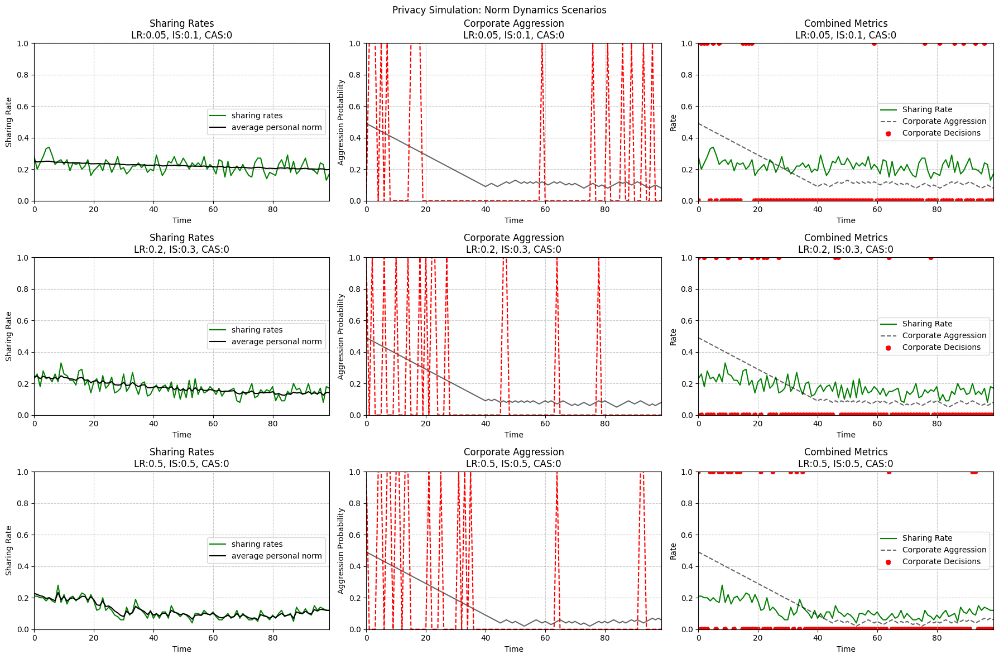

In [ ]:
scenarios = [
    {'learning_rate': 0.05, 'influence_strength': 0.1, 'corporate_aggression_sensitivity':0}, #slow norm adaptation and minimal social influence
    {'learning_rate': 0.2, 'influence_strength': 0.3, 'corporate_aggression_sensitivity':0}, #moderate norm change and moderate social pressure
    {'learning_rate': 0.5, 'influence_strength': 0.5, 'corporate_aggression_sensitivity':0} #rapid norm adaptation and strong collective behavior
]

# Run the scenario comparison
run_scenario_comparison(scenarios, time=100)

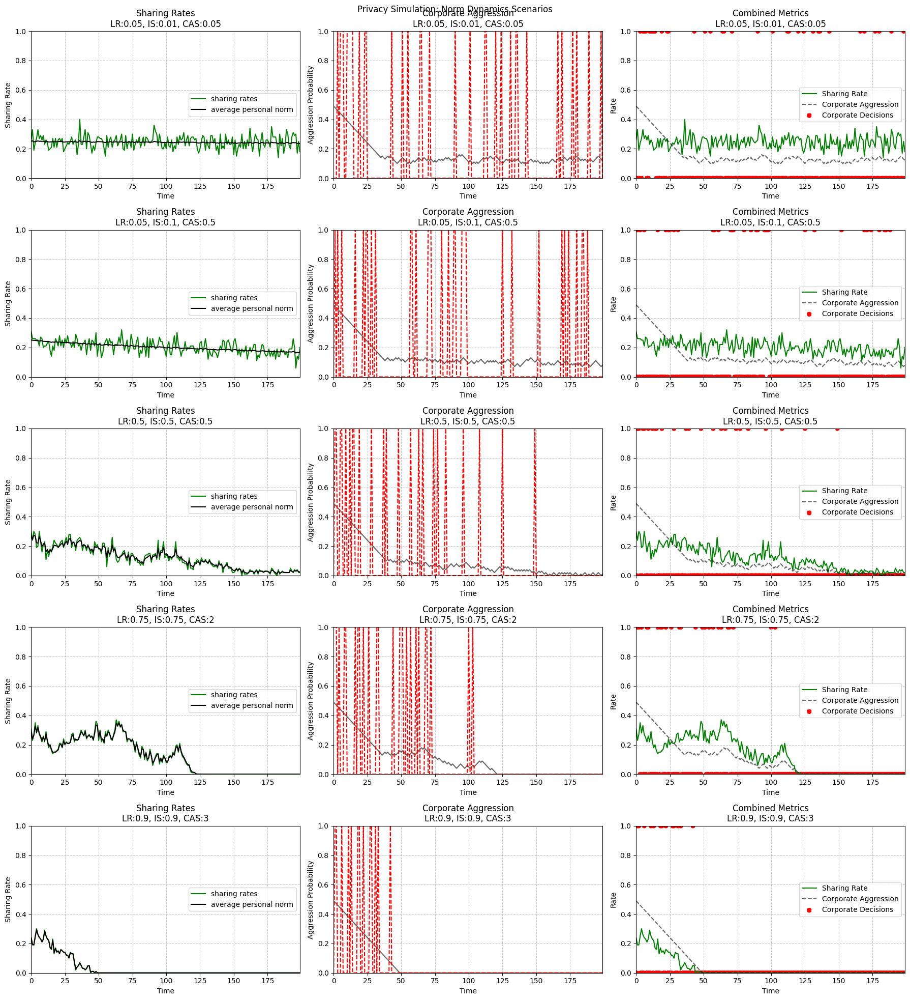

In [ ]:
scenarios = [
    {'learning_rate': 0.05, 'influence_strength':0.01,'corporate_aggression_sensitivity': 0.05}, #slow norm adaptation and minimal social influence
    {'learning_rate': 0.05,'influence_strength':0.1, 'corporate_aggression_sensitivity': 0.5}, #moderate norm change and moderate social pressure
    {'learning_rate': 0.5,'influence_strength':0.5, 'corporate_aggression_sensitivity': 0.5}, #rapid norm adaptation and strong collective behavior
    {'learning_rate': 0.75,'influence_strength':0.75, 'corporate_aggression_sensitivity': 2}, #rapid norm adaptation and strong collective behavior
    {'learning_rate': 0.90,'influence_strength':0.90, 'corporate_aggression_sensitivity': 3} #rapid norm adaptation and strong collective behavior

]

# Run the scenario comparison
run_scenario_comparison(scenarios, time=200)

## Checking Scenarios with Pause and Corporate Aggression Sensitivity

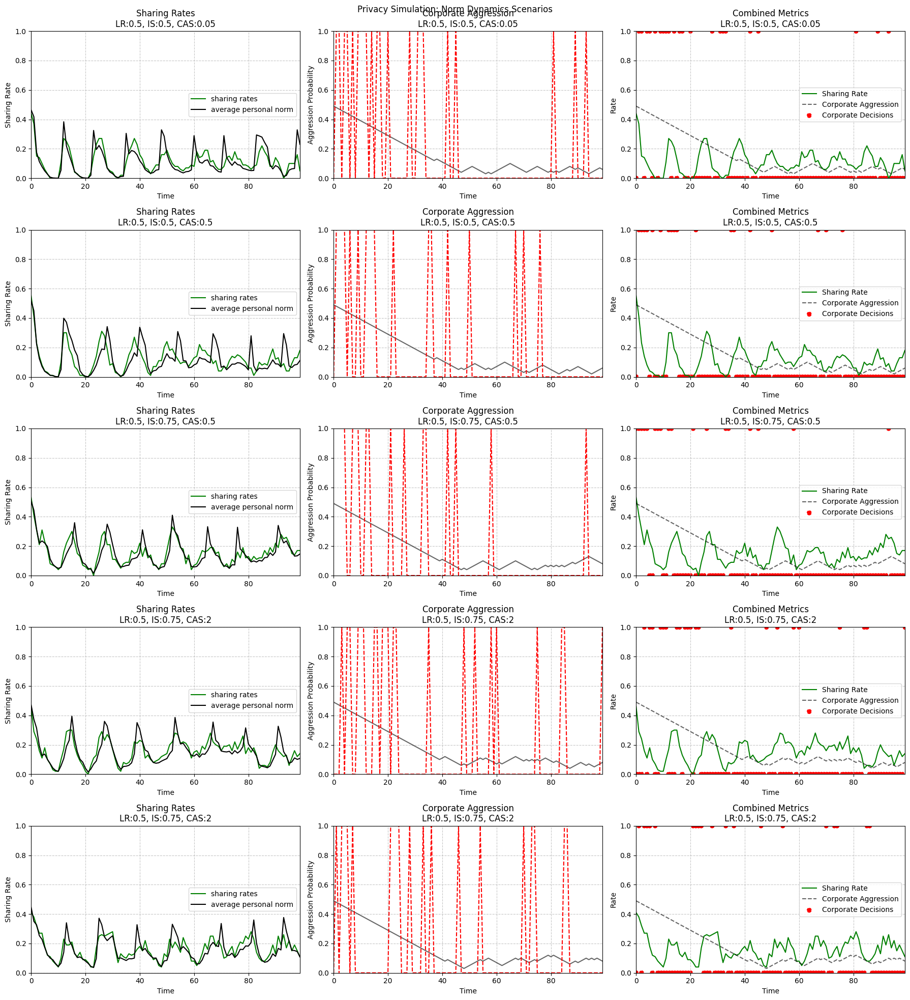

In [ ]:
scenarios = [
    {'dr_pause':30,'learning_rate': 0.5, 'influence_strength':0.5,'corporate_aggression_sensitivity': 0.05}, #slow norm adaptation and minimal social influence
    {'dr_pause':2,'learning_rate': 0.5,'influence_strength':0.5, 'corporate_aggression_sensitivity': 0.5}, #moderate norm change and moderate social pressure
    {'dr_pause':7,'learning_rate': 0.5,'influence_strength':0.75, 'corporate_aggression_sensitivity': 0.5}, #rapid norm adaptation and strong collective behavior
    {'dr_pause':14,'learning_rate': 0.5,'influence_strength':0.75, 'corporate_aggression_sensitivity': 2}, #rapid norm adaptation and strong collective behavior
    {'dr_pause':0,'learning_rate': 0.5,'influence_strength':0.75, 'corporate_aggression_sensitivity': 2} #rapid norm adaptation and strong collective behavior

]

# Run the scenario comparison
run_scenario_comparison(scenarios, time=100)

## Individual Sensitivity to Corporate Aggression


In [ ]:
class IndividualAgent:
    def __init__(self,
                 initial_sharing_prob: float = 0.5,
                 risk_tolerance: float = 0.5,
                 norm_learning_rate: float = 0.1,
                 social_influence_strength: float = 0.2,
                 corporate_aggression_sensitivity: float = 0.5):
        """
        Initialize an individual agent with sensitivity to corporate aggression

        Args:
            corporate_aggression_sensitivity (float): How much corporate aggression
            influences individual sharing decisions (0-1 range)
        """
        # Individual characteristics
        self.sharing_prob = initial_sharing_prob
        self.risk_tolerance = risk_tolerance

        # Norm-related attributes
        self.personal_sharing_norm = initial_sharing_prob
        self.norm_learning_rate = norm_learning_rate
        self.social_influence_strength = social_influence_strength

        # Corporate aggression sensitivity
        self.corporate_aggression_sensitivity = corporate_aggression_sensitivity

        # Track last known corporate aggression level
        self.last_corporate_aggression = 0.5

    def decide_to_share(self, current_corporate_aggression: float) -> bool:
        """
        Stochastic decision to share information, influenced by:
        - Personal and social norms
        - Corporate aggression level

        Args:
            current_corporate_aggression (float): Current level of corporate aggression

        Returns:
            bool: Whether agent decides to share information
        """
        # Store current corporate aggression for potential use in norm updates
        self.last_corporate_aggression = current_corporate_aggression

        # Reduce sharing probability based on corporate aggression
        aggression_reduction = (
            current_corporate_aggression * self.corporate_aggression_sensitivity)

        sharing_encouragement = 1 - aggression_reduction

        # Combine personal probability with norm influence and aggression reduction
        adjusted_sharing_prob = (
            self.sharing_prob * (1 - self.social_influence_strength) +
            self.personal_sharing_norm * self.social_influence_strength
        ) * (1 - aggression_reduction) #+ (aggression_amplification * 0.5)

        return random.random() < max(0, adjusted_sharing_prob)

    def update_sharing_norm(self, current_social_norm: float):
        """
        Update personal sharing norm based on observed social norm
        and current corporate aggression
        """
        # Gradually adjust personal norm towards social norm
        self.personal_sharing_norm += self.norm_learning_rate * (
            current_social_norm - self.personal_sharing_norm
        )

        # Modify norm based on corporate aggression
        self.personal_sharing_norm *= (1 - self.last_corporate_aggression * 0.5)

        # Update individual sharing probability
        self.sharing_prob = (
            self.sharing_prob * (1 - self.norm_learning_rate) +
            self.personal_sharing_norm * self.norm_learning_rate
        )



In [ ]:
class PrivacySimulation:
    def __init__(self,
                 num_individuals: int = 1000,
                 initial_corporate_aggression: float = 0.5,
                 norm_learning_rate: float = 0.1,
                 social_influence_strength: float = 0.2,
                 corporate_aggression_sensitivity: float = 0.5):
        """
        Initialize the privacy exploitation simulation

        Added corporate_aggression_sensitivity to pass to individual agents
        """
        # Simulation parameters
        self.num_individuals = num_individuals
        self.corporate_aggression_prob = initial_corporate_aggression
        self.norm_learning_rate = norm_learning_rate
        self.social_influence_strength = social_influence_strength

        # Track simulation state
        self.current_iteration = 0
        self.individual_sharing_history = []
        self.corporate_strategy_history = []
        self.norm_history = []

        # Initialize agents with corporate aggression sensitivity
        self.individual_agents = [
            IndividualAgent(
                norm_learning_rate=self.norm_learning_rate,
                social_influence_strength=self.social_influence_strength,
                corporate_aggression_sensitivity=corporate_aggression_sensitivity
            ) for _ in range(num_individuals)
        ]
        self.corporate_agent = CorporateAgent()

    def run_iteration(self):
        """
        Run a single iteration of the simulation
        """
        # Individual sharing decisions
        individual_sharing_decisions = [
            agent.decide_to_share(self.corporate_aggression_prob)
            for agent in self.individual_agents
        ]

        # Calculate sharing rate
        sharing_rate = sum(individual_sharing_decisions) / self.num_individuals

        # Update individual agents' norms based on aggregate behavior
        for agent in self.individual_agents:
            agent.update_sharing_norm(sharing_rate)

        # Corporate strategy selection
        corporate_strategy = self.corporate_agent.choose_strategy(
            self.corporate_aggression_prob
        )

        # Update corporate aggression probability based on sharing rate
        if sharing_rate > 0.5:
            # If majority share, increase likelihood of aggressive strategy
            self.corporate_aggression_prob = min(
                1.0,
                self.corporate_aggression_prob + 0.1
            )
        else:
            # If majority resist, decrease likelihood of aggressive strategy
            self.corporate_aggression_prob = max(
                0.0,
                self.corporate_aggression_prob - 0.1
            )

        # Record history
        self.individual_sharing_history.append(sharing_rate)
        self.corporate_strategy_history.append(corporate_strategy)
        self.norm_history.append(sharing_rate)

        # Increment iteration
        self.current_iteration += 1

        return {
            'iteration': self.current_iteration,
            'sharing_rate': sharing_rate,
            'corporate_strategy': corporate_strategy,
            'corporate_aggression_prob': self.corporate_aggression_prob,
            'sharing_norm': sharing_rate
        }

    def run_simulation(self, num_iterations: int = 10):
        """
        Run the full simulation for specified number of iterations
        """
        results = []
        for _ in range(num_iterations):
            iteration_result = self.run_iteration()
            results.append(iteration_result)

        return results

## Run Scenarios under the updated individual agent

Sharing norm:  0.5
Sharing norm:  0.236
Sharing norm:  0.251
Sharing norm:  0.233
Sharing norm:  0.253
Sharing norm:  0.258
Sharing norm:  0.5
Sharing norm:  0.259
Sharing norm:  0.221
Sharing norm:  0.258
Sharing norm:  0.259
Sharing norm:  0.261
Sharing norm:  0.5
Sharing norm:  0.237
Sharing norm:  0.219
Sharing norm:  0.246
Sharing norm:  0.239
Sharing norm:  0.256


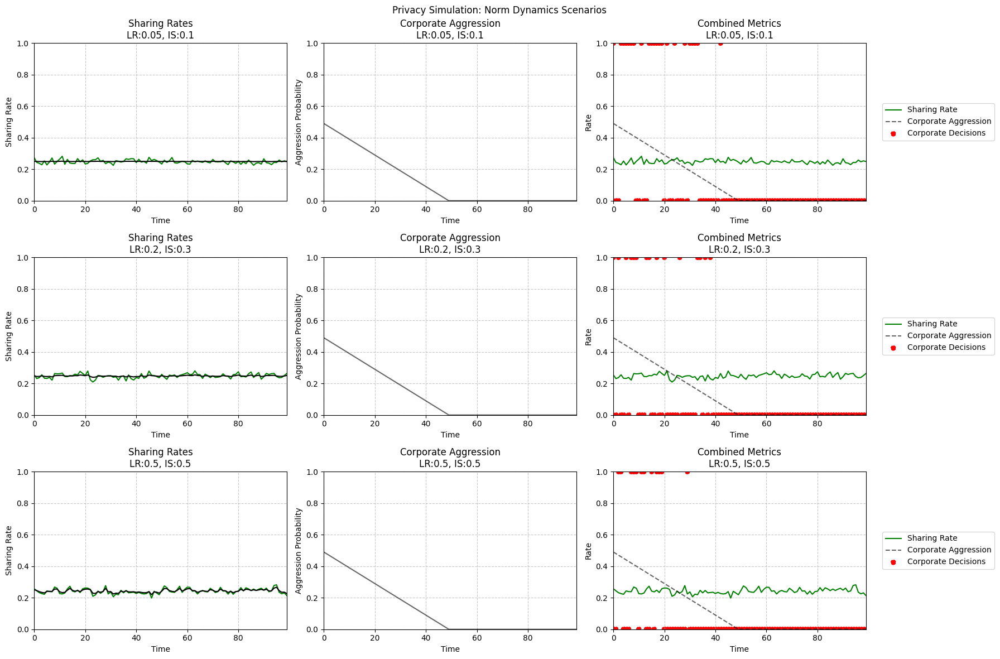

In [ ]:
scenarios = [
    {'learning_rate': 0.05, 'influence_strength': 0.1, 'corporate_aggression_sensitivity': 0.8, 'initial_corporate_aggression': 0.5},  # Moderate aggression sensitivity  #slow norm adaptation and minimal social influence
    {'learning_rate': 0.2, 'influence_strength': 0.3, 'corporate_aggression_sensitivity': 0.8, 'initial_corporate_aggression': 0.5}, # Moderate aggression sensitivity#moderate norm change and moderate social pressure
    {'learning_rate': 0.5, 'influence_strength': 0.5, 'corporate_aggression_sensitivity': 0.8, 'initial_corporate_aggression': 0.5} # Moderate aggression sensitivity #rapid norm adaptation and strong collective behavior
]

# Run the scenario comparison
run_scenario_comparison(scenarios, time=100)

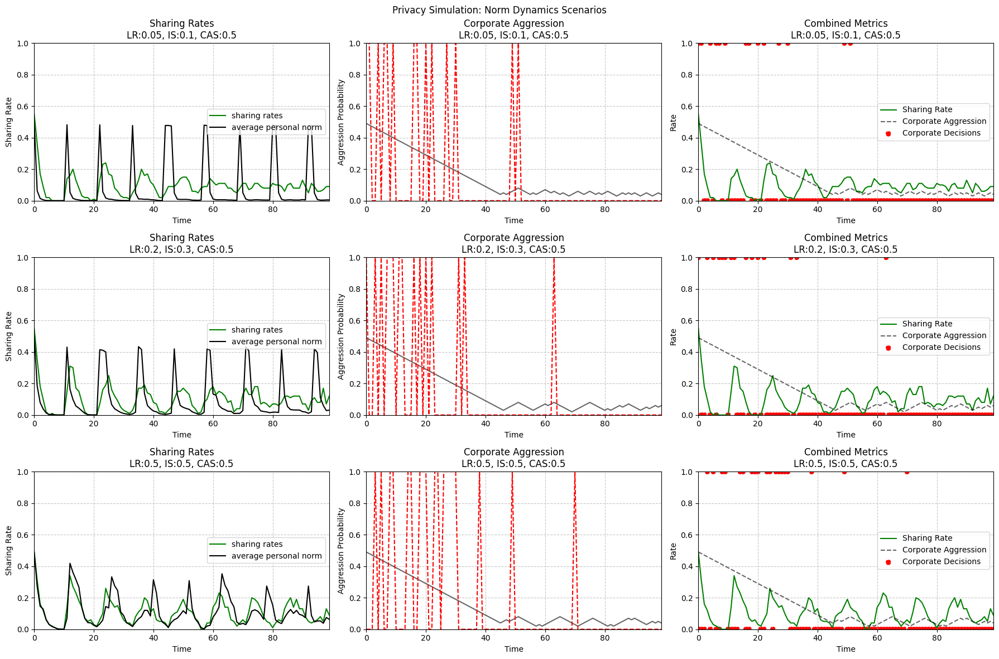

In [ ]:
scenarios = [
    {'learning_rate': 0.05, 'influence_strength': 0.1, 'corporate_aggression_sensitivity': 0.5},  # Moderate aggression sensitivity  #slow norm adaptation and minimal social influence
    {'learning_rate': 0.2, 'influence_strength': 0.3, 'corporate_aggression_sensitivity': 0.5}, # Moderate aggression sensitivity#moderate norm change and moderate social pressure
    {'learning_rate': 0.5, 'influence_strength': 0.5, 'corporate_aggression_sensitivity': 0.5} # Moderate aggression sensitivity #rapid norm adaptation and strong collective behavior
]

# Run the scenario comparison
run_scenario_comparison(scenarios, time=100)

## Recreating 100 population Iterations Under Corporate Aggression Sensitivity, Learning Rate and Social Influence

In [ ]:
# Example usage in Jupyter Notebook
step_3b_results = []
for population in range(100):
  simulation = PrivacySimulation(num_individuals=100, initial_corporate_aggression=0.5, corporate_step_boldness=0.01)
  results = simulation.run_simulation(time=1000)
  for result in results:
    result['iteration'] = population
  step_3b_results.append(results)

#step_1b_results_df = pd.DataFrame(step_1b_results)


## Change Due to Corporate Aggression Sensitivy

In [ ]:
# prompt: simulate this 100 times for initial_gorporate_aggression going from 0.01 to 1.00 for each time check the correlation between sharing rate and corporate aggression. and plot the correlations against initial corporate aggression in a line chart with confidence intervals. simulation.run_simulation(num_iterations=2000)

correlations_data = []
cas_sensitivity_large = []
for cas in np.linspace(0.01, 3.00, 100):
  correlations = []
  late_aggression_list = []
  corporate_aggr_decisions_list = []
  for population in range(100):
    simulation = PrivacySimulation_2(num_individuals=100,
                                     corporate_aggression_sensitivity=cas,
                                     norm_learning_rate=0,
                                     initial_norm= 0.5,
                                     initial_sharing_prob= 0.5,
                                     corporate_step_boldness=0.01,
                                     platform_tenure = 10,
                                     social_influence_strength=0,
                                     initial_corporate_aggression=0.5,
                                     dr_pause=0)
    results = simulation.run_simulation(time=100)
    #for result in results: #comment this out to skip building large dataset
    #  result['cas_level'] = cas
    #  result['iteration'] = population
    #cas_sensitivity_large.append(results) #comment this out to skip building large dataset
    results_df = pd.DataFrame(results)
    results_df['corporate_decision_history'] = results_df['corporate_decision_history'].astype(int)
    correlation = results_df['sharing_rate'].corr(results_df['corporate_aggression_prob'])
    correlations.append(correlation)
    corporate_aggr_decision = results_df['corporate_decision_history'].sum()/len(results_df['corporate_decision_history'])
    corporate_aggr_decisions_list.append(corporate_aggr_decision)


    # Determine the index for the last quartile
    last_quartile_start = int(0.75 * len(results_df['corporate_decision_history']))

    # Extract the last quartile of corporate decision history
    last_quartile_data = results_df['corporate_decision_history'].iloc[last_quartile_start:]

    # Compute late aggression
    late_aggression = last_quartile_data.sum() / len(last_quartile_data)
    late_aggression_list.append(late_aggression)

  # Calculate mean and confidence interval
  mean_correlation = np.mean(correlations)
  std_correlation = np.std(correlations)
  mean_corp_decisions = np.mean(corporate_aggr_decisions_list)
  std_corp_decisions = np.std(corporate_aggr_decisions_list)
  confidence_interval = 1.96 * (std_correlation / np.sqrt(len(correlations)))  # 95% CI
  std_late_aggression = np.std(late_aggression_list)
  mean_late_aggression = np.mean(late_aggression_list)

  correlations_data.append({
      'cas_level': cas,
      'mean_correlation': mean_correlation,
      'confidence_interval': confidence_interval,
      'correlation_stdev': std_correlation,
      'corporate_decision_history': corporate_aggr_decisions,
      'mean_late_aggression': late_aggression,
      'late_aggression_stdev': std_late_aggression,
      'mean_corp_decisions': mean_corp_decisions,
      'corp_decisions_stdev': std_corp_decisions

  })


# Create a DataFrame from the correlations data
cas_correlations = pd.DataFrame(correlations_data)




In [ ]:
cas_correlations['lagged_corporate_decision_history'] = (
    cas_correlations['mean_corp_decisions']
    .transform(lambda x: x.rolling(window=10, min_periods=1).mean())
)


In [ ]:
cas_correlations

,cas_level,mean_correlation,confidence_interval,correlation_stdev,corporate_decision_history,mean_late_aggression,late_aggression_stdev,mean_corp_decisions,corp_decisions_stdev,lagged_corporate_decision_history
0,0.010000,0.115375,0.020466,0.104417,0.18,0.00,0.059135,0.1999,0.034511,0.199900
1,0.040202,0.283335,0.020273,0.103435,0.18,0.04,0.051255,0.1896,0.034494,0.194750
2,0.070404,0.391171,0.020166,0.102888,0.18,0.16,0.062598,0.1913,0.034049,0.193600
3,0.100606,0.485189,0.014412,0.073531,0.18,0.12,0.062711,0.1817,0.037498,0.190625
4,0.130808,0.571581,0.014749,0.075248,0.18,0.12,0.051491,0.1706,0.034837,0.186620
...,...,...,...,...,...,...,...,...,...,...
95,2.879192,0.801971,0.006173,0.031493,0.18,0.00,0.015718,0.1319,0.029688,0.131240
96,2.909394,0.802266,0.005362,0.027355,0.18,0.00,0.018500,0.1295,0.031666,0.131070
97,2.939596,0.801782,0.006712,0.034243,0.18,0.00,0.018150,0.1312,0.034793,0.131110
98,2.969798,0.800701,0.005834,0.029767,0.18,0.04,0.017083,0.1298,0.028670,0.131220


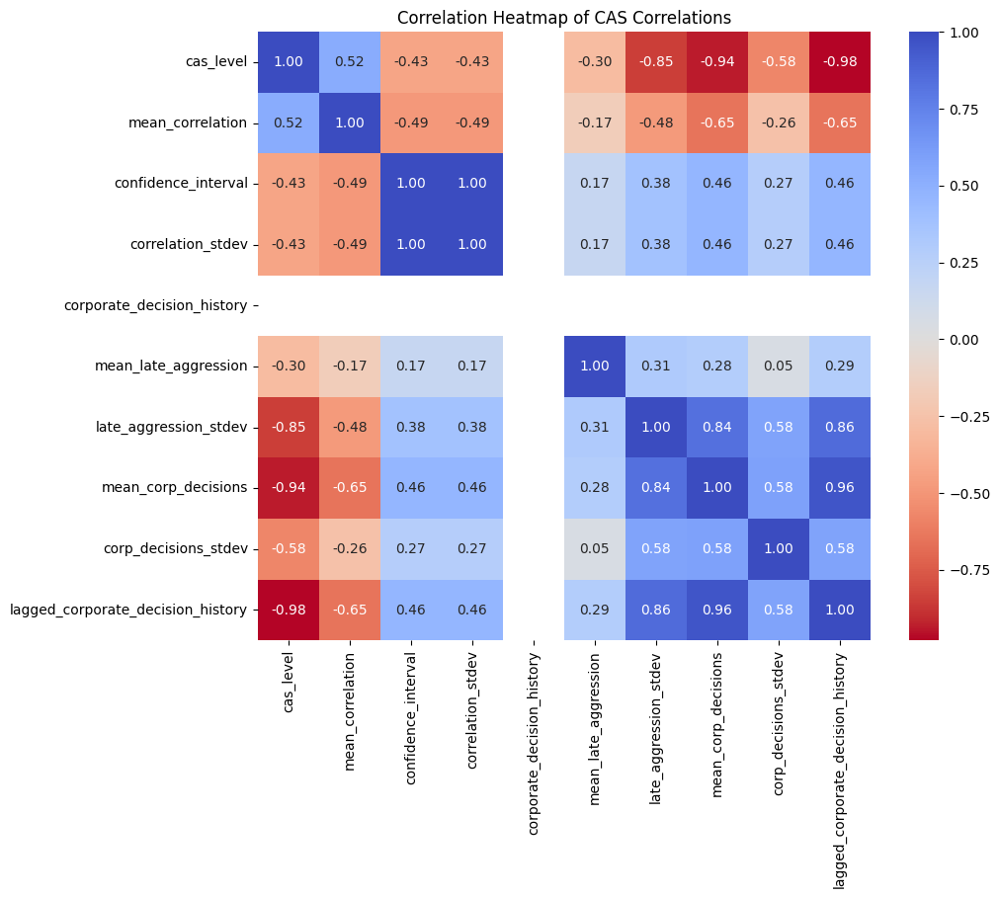

In [ ]:
# prompt: get seaborn correlation heatmap for cas_correlations

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'cas_correlations' DataFrame is already created as in the provided code

# Create the correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(cas_correlations.corr(), annot=True, cmap='coolwarm_r', fmt=".2f")
plt.title('Correlation Heatmap of CAS Correlations')
plt.show()


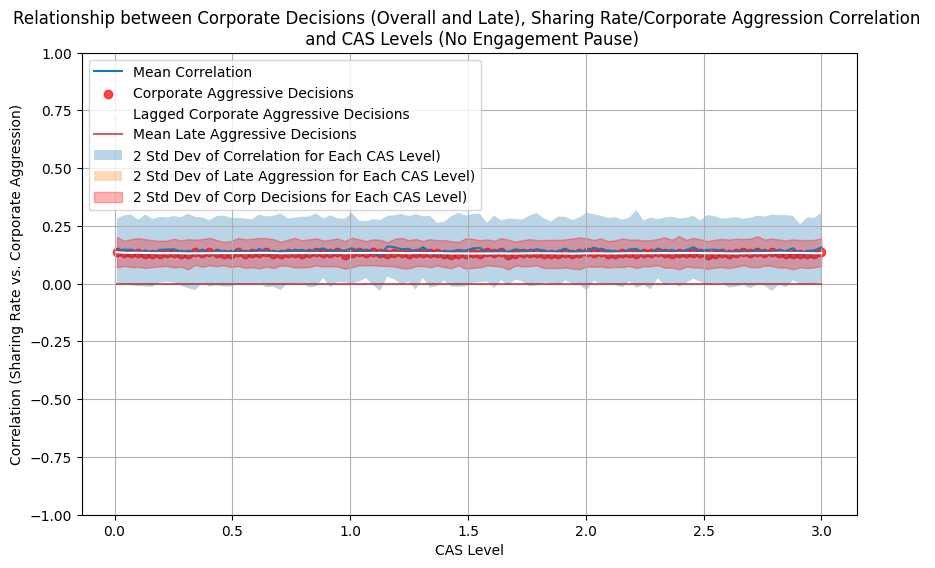

In [ ]:
# Plot the correlations against initial corporate aggression
plt.figure(figsize=(10, 6))
plt.plot(cas_correlations['cas_level'], cas_correlations['mean_correlation'], label='Mean Correlation')
plt.scatter(cas_correlations['cas_level'], cas_correlations['mean_corp_decisions'], label='Corporate Aggressive Decisions', alpha = 0.7,color='red')
plt.plot(cas_correlations['cas_level'], cas_correlations['lagged_corporate_decision_history'], label='Lagged Corporate Aggressive Decisions', color = 'white')
plt.plot(cas_correlations['cas_level'], cas_correlations['mean_late_aggression'], label='Mean Late Aggressive Decisions', alpha = 0.7,color='brown')

plt.fill_between(
    cas_correlations['cas_level'],
    cas_correlations['mean_correlation'] - 2 * cas_correlations['correlation_stdev'],
    cas_correlations['mean_correlation'] + 2 * cas_correlations['correlation_stdev'],
    alpha=0.3,
    label='2 Std Dev of Correlation for Each CAS Level)'
)

plt.fill_between(
    cas_correlations['cas_level'],
    cas_correlations['mean_late_aggression'] - 2 * cas_correlations['late_aggression_stdev'],
    cas_correlations['mean_late_aggression'] + 2 * cas_correlations['late_aggression_stdev'],
    alpha=0.3,
    label='2 Std Dev of Late Aggression for Each CAS Level)'
)

plt.fill_between(
    cas_correlations['cas_level'],
    cas_correlations['mean_corp_decisions'] - 2 * cas_correlations['corp_decisions_stdev'],
    cas_correlations['mean_corp_decisions'] + 2 * cas_correlations['corp_decisions_stdev'],
    alpha=0.3, color = 'red',
    label='2 Std Dev of Corp Decisions for Each CAS Level)'
)


plt.xlabel('CAS Level')
plt.ylabel('Correlation (Sharing Rate vs. Corporate Aggression)')
plt.title('Relationship between Corporate Decisions (Overall and Late), Sharing Rate/Corporate Aggression Correlation \n and CAS Levels (No Engagement Pause)')
plt.ylim(-1, 1)  # Set the y-axis limits to 0 and 1
#plt.xlim(0, 3)  # Set the y-axis limits to 0 and 1

plt.legend()
plt.grid(True)
plt.show()

## Testing with Everything bu CAS at Zero

In [ ]:
help(PrivacySimulation_2)

Help on class PrivacySimulation_2 in module __main__:

class PrivacySimulation_2(builtins.object)
 |  PrivacySimulation_2(num_individuals: int = 100, initial_corporate_aggression: float = 0.5, initial_norm: float = 0.5, norm_learning_rate: float = 0.1, corporate_step_boldness: float = 0.01, dr_pause: int = 10, initial_sharing_prob: float = 0.5, platform_tenure: int = 10, corporate_aggression_sensitivity: float = 0.1, social_influence_strength: float = 0.2)
 |  
 |  Methods defined here:
 |  
 |  __init__(self, num_individuals: int = 100, initial_corporate_aggression: float = 0.5, initial_norm: float = 0.5, norm_learning_rate: float = 0.1, corporate_step_boldness: float = 0.01, dr_pause: int = 10, initial_sharing_prob: float = 0.5, platform_tenure: int = 10, corporate_aggression_sensitivity: float = 0.1, social_influence_strength: float = 0.2)
 |      Initialize the privacy exploitation simulation with norm dynamics
 |      
 |      Args:
 |          N num_individuals (int): Number of i

In [ ]:
# prompt: simulate this 100 times for initial_gorporate_aggression going from 0.01 to 1.00 for each time check the correlation between sharing rate and corporate aggression. and plot the correlations against initial corporate aggression in a line chart with confidence intervals. simulation.run_simulation(num_iterations=2000)

correlations_data = []
cas_sensitivity_large = []
for cas in np.linspace(0.01, 3.00, 100):
  correlations = []
  late_aggression_list = []
  corporate_aggr_decisions_list = []
  for population in range(100):
    simulation = PrivacySimulation_2(num_individuals=100,
                                     corporate_aggression_sensitivity=cas,
                                     norm_learning_rate=0,
                                     initial_norm= 0.5,
                                     initial_sharing_prob= 0.5,
                                     corporate_step_boldness=0.01,
                                     platform_tenure = 10,
                                     social_influence_strength=0,
                                     initial_corporate_aggression=0.5,
                                     dr_pause=0)
    results = simulation.run_simulation(time=100)
    #for result in results: #comment this out to skip building large dataset
    #  result['cas_level'] = cas
    #  result['iteration'] = population
    #cas_sensitivity_large.append(results) #comment this out to skip building large dataset
    results_df = pd.DataFrame(results)
    results_df['corporate_decision_history'] = results_df['corporate_decision_history'].astype(int)
    correlation = results_df['sharing_rate'].corr(results_df['corporate_aggression_prob'])
    correlations.append(correlation)
    corporate_aggr_decision = results_df['corporate_decision_history'].sum()/len(results_df['corporate_decision_history'])
    corporate_aggr_decisions_list.append(corporate_aggr_decision)


    # Determine the index for the last quartile
    last_quartile_start = int(0.75 * len(results_df['corporate_decision_history']))

    # Extract the last quartile of corporate decision history
    last_quartile_data = results_df['corporate_decision_history'].iloc[last_quartile_start:]

    # Compute late aggression
    late_aggression = last_quartile_data.sum() / len(last_quartile_data)
    late_aggression_list.append(late_aggression)

  # Calculate mean and confidence interval
  mean_correlation = np.mean(correlations)
  std_correlation = np.std(correlations)
  mean_corp_decisions = np.mean(corporate_aggr_decisions_list)
  std_corp_decisions = np.std(corporate_aggr_decisions_list)
  confidence_interval = 1.96 * (std_correlation / np.sqrt(len(correlations)))  # 95% CI
  std_late_aggression = np.std(late_aggression_list)
  mean_late_aggression = np.mean(late_aggression_list)

  correlations_data.append({
      'cas_level': cas,
      'mean_correlation': mean_correlation,
      'confidence_interval': confidence_interval,
      'correlation_stdev': std_correlation,
      'corporate_decision_history': corporate_aggr_decisions,
      'mean_late_aggression': late_aggression,
      'late_aggression_stdev': std_late_aggression,
      'mean_corp_decisions': mean_corp_decisions,
      'corp_decisions_stdev': std_corp_decisions

  })


# Create a DataFrame from the correlations data
cas_correlations = pd.DataFrame(correlations_data)




In [ ]:
cas_correlations['lagged_corporate_decision_history'] = (
    cas_correlations['mean_corp_decisions']
    .transform(lambda x: x.rolling(window=10, min_periods=1).mean())
)


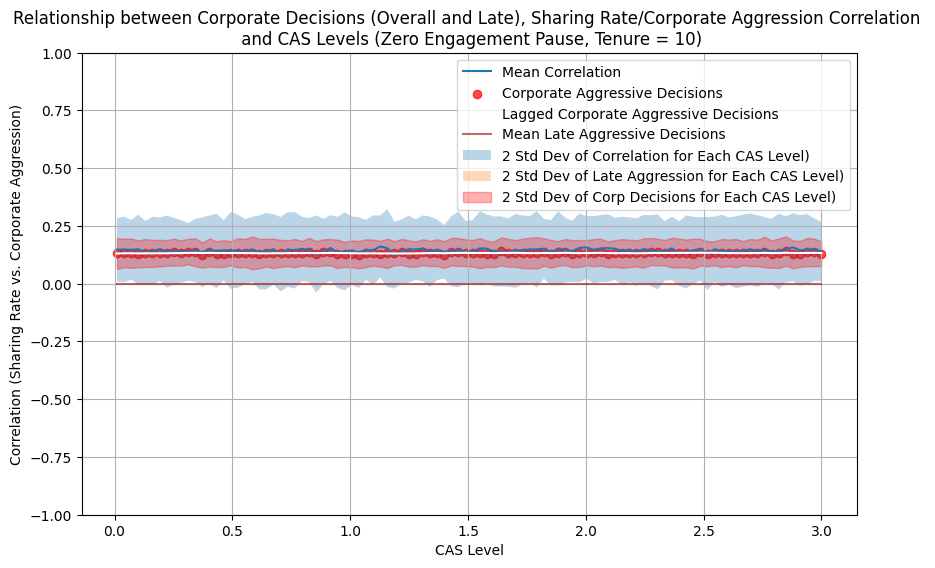

In [ ]:
# Plot the correlations against initial corporate aggression
plt.figure(figsize=(10, 6))
plt.plot(cas_correlations['cas_level'], cas_correlations['mean_correlation'], label='Mean Correlation')
plt.scatter(cas_correlations['cas_level'], cas_correlations['mean_corp_decisions'], label='Corporate Aggressive Decisions', alpha = 0.7,color='red')
plt.plot(cas_correlations['cas_level'], cas_correlations['lagged_corporate_decision_history'], label='Lagged Corporate Aggressive Decisions', color = 'white')
plt.plot(cas_correlations['cas_level'], cas_correlations['mean_late_aggression'], label='Mean Late Aggressive Decisions', alpha = 0.7,color='brown')

plt.fill_between(
    cas_correlations['cas_level'],
    cas_correlations['mean_correlation'] - 2 * cas_correlations['correlation_stdev'],
    cas_correlations['mean_correlation'] + 2 * cas_correlations['correlation_stdev'],
    alpha=0.3,
    label='2 Std Dev of Correlation for Each CAS Level)'
)

plt.fill_between(
    cas_correlations['cas_level'],
    cas_correlations['mean_late_aggression'] - 2 * cas_correlations['late_aggression_stdev'],
    cas_correlations['mean_late_aggression'] + 2 * cas_correlations['late_aggression_stdev'],
    alpha=0.3,
    label='2 Std Dev of Late Aggression for Each CAS Level)'
)

plt.fill_between(
    cas_correlations['cas_level'],
    cas_correlations['mean_corp_decisions'] - 2 * cas_correlations['corp_decisions_stdev'],
    cas_correlations['mean_corp_decisions'] + 2 * cas_correlations['corp_decisions_stdev'],
    alpha=0.3, color = 'red',
    label='2 Std Dev of Corp Decisions for Each CAS Level)'
)


plt.xlabel('CAS Level')
plt.ylabel('Correlation (Sharing Rate vs. Corporate Aggression)')
plt.title('Relationship between Corporate Decisions (Overall and Late), Sharing Rate/Corporate Aggression Correlation \n and CAS Levels (Zero Engagement Pause, Tenure = 10)')
plt.ylim(-1, 1)  # Set the y-axis limits to 0 and 1
#plt.xlim(0, 3)  # Set the y-axis limits to 0 and 1

plt.legend()
plt.grid(True)
plt.show()